In [20]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scrublet as scr
import matplotlib.image as img
import scanpy.external as sce
import harmonypy as hm
import celltypist
from celltypist import models
from scipy.sparse import csr_matrix
import scvelo as scv
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
from matplotlib.gridspec import GridSpec
import scipy.sparse
from sklearn.decomposition import NMF
from sklearn.cluster import KMeans
import liana

# Data Loading

In [2]:
sc.settings.figdir = './figures'

In [2]:
sample_paths = [
    "./samples/HB17_PDX_filtered_feature_bc_matrix/",
    "./samples/HB17_background_filtered_feature_bc_matrix/",
    "./samples/HB17_tumor_filtered_feature_bc_matrix/",
    "./samples/HB30_PDX_filtered_feature_bc_matrix/",
    "./samples/HB30_tumor_filtered_feature_bc_matrix/",
    "./samples/HB53_background_filtered_feature_bc_matrix/",
    "./samples/HB53_tumor_filtered_feature_bc_matrix/"
]

sample_names = ["hb17_pdx", "hb17_back", "hb17_tumor", "hb30_pdx", "hb30_tumor", "hb53_back", "hb53_tumor"]

adatas = {}
for path, name in zip(sample_paths, sample_names):
    adata = sc.read_10x_mtx(path, var_names='gene_symbols')
    adata.obs['sample'] = name
    adatas[name] = adata
    print(f"Loaded {name}: {adata.n_obs} cells, {adata.n_vars} genes")

Loaded hb17_pdx: 8027 cells, 33538 genes
Loaded hb17_back: 11197 cells, 33538 genes
Loaded hb17_tumor: 7995 cells, 33538 genes
Loaded hb30_pdx: 10303 cells, 33538 genes
Loaded hb30_tumor: 19042 cells, 33538 genes
Loaded hb53_back: 8540 cells, 33538 genes
Loaded hb53_tumor: 12832 cells, 33538 genes


# Preprocessing 

Let's first find the number and percent of mitochondrial genes in each sample

... storing 'sample' as categorical
... storing 'feature_types' as categorical


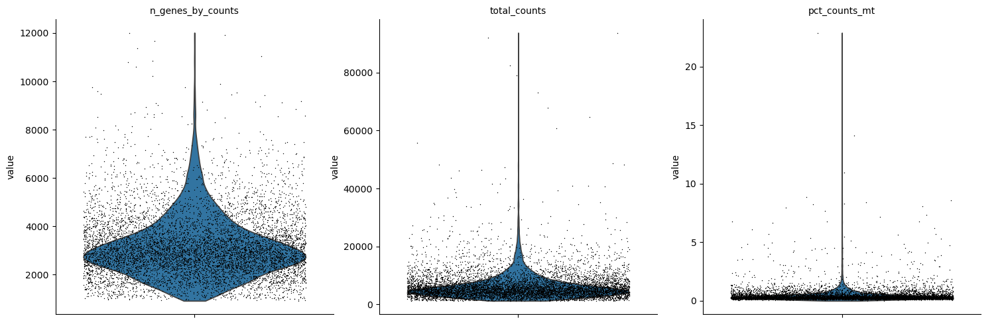

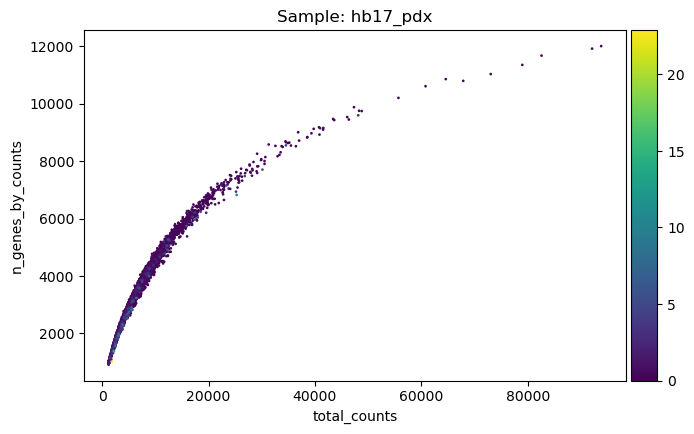

... storing 'sample' as categorical
... storing 'feature_types' as categorical


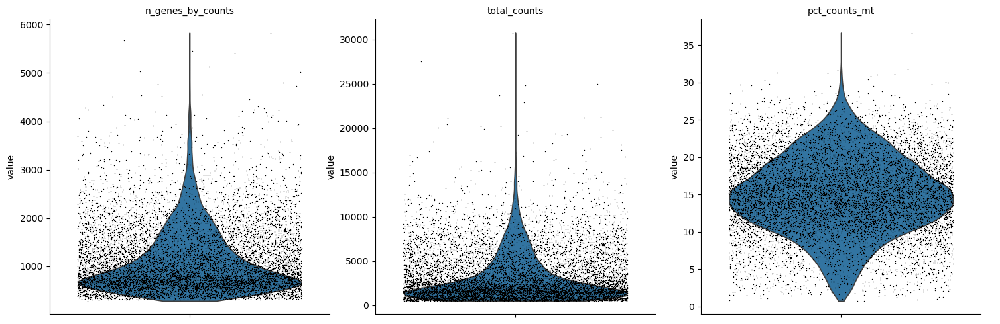

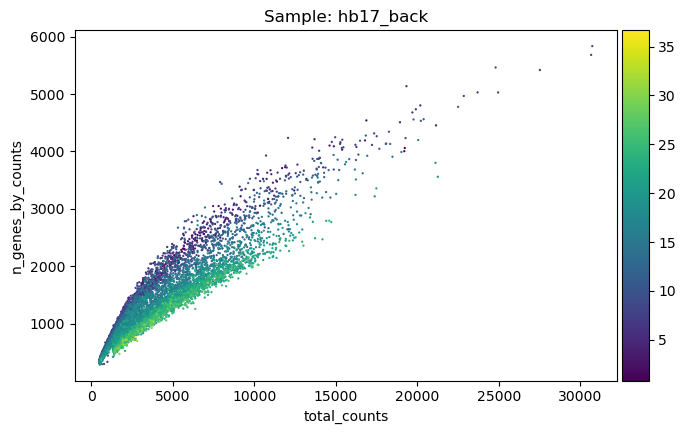

... storing 'sample' as categorical
... storing 'feature_types' as categorical


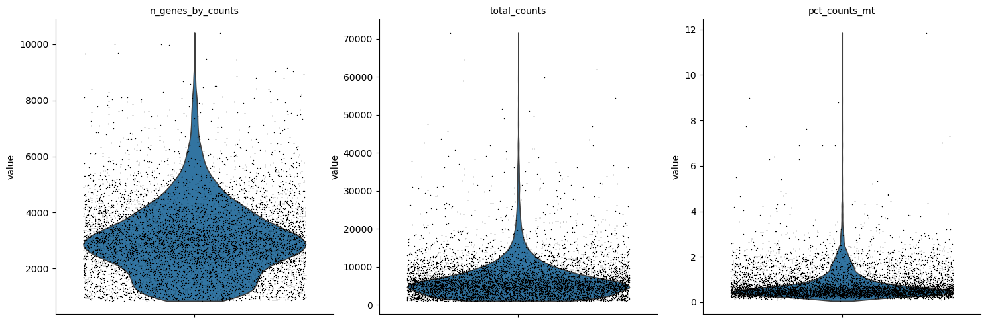

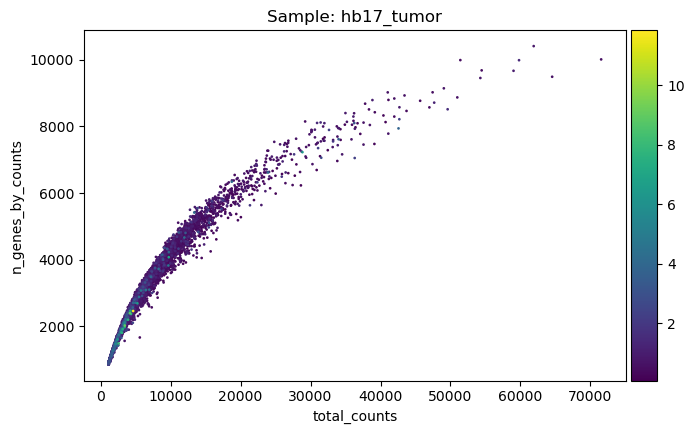

... storing 'sample' as categorical
... storing 'feature_types' as categorical


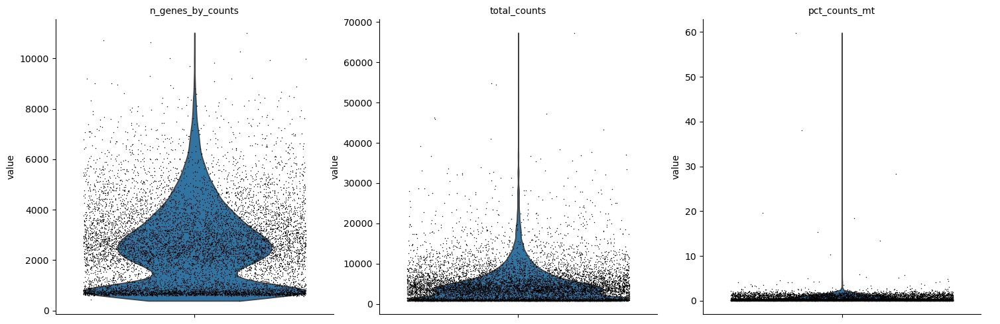

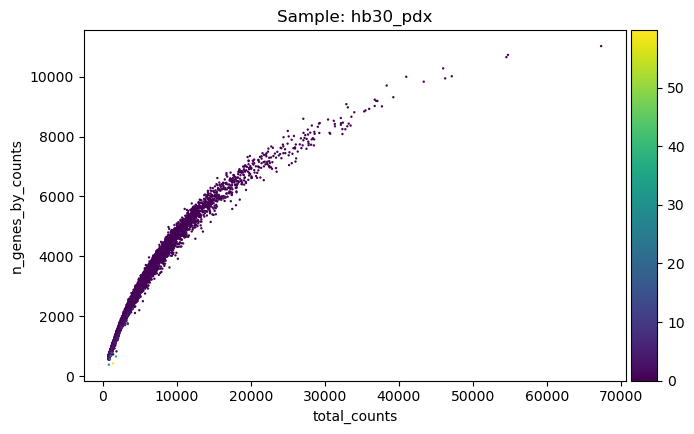

... storing 'sample' as categorical
... storing 'feature_types' as categorical


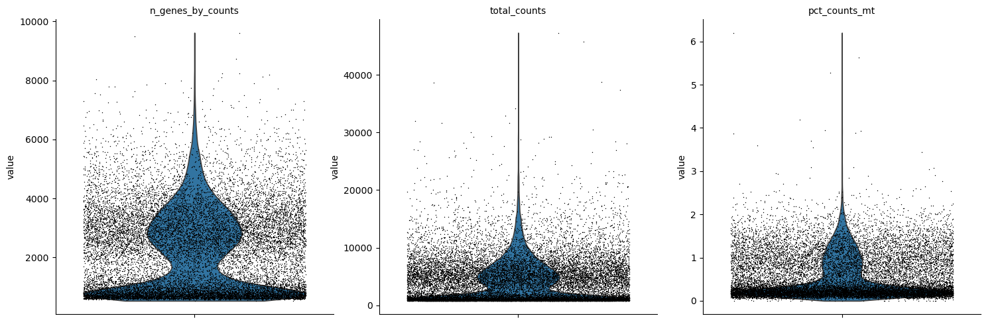

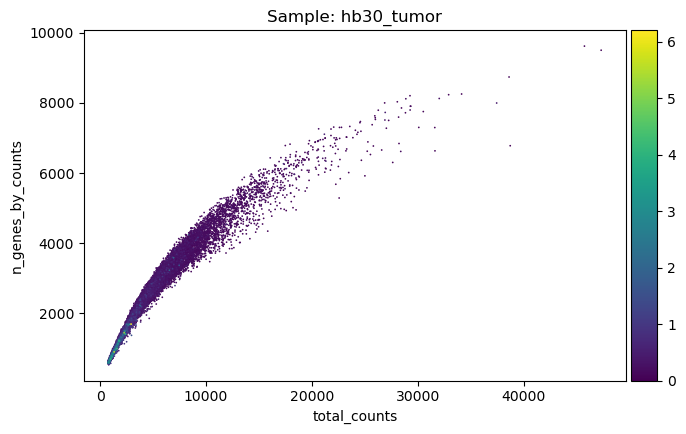

... storing 'sample' as categorical
... storing 'feature_types' as categorical


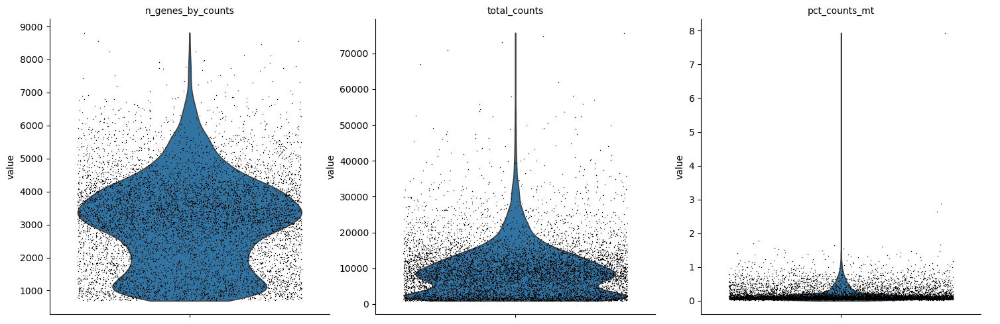

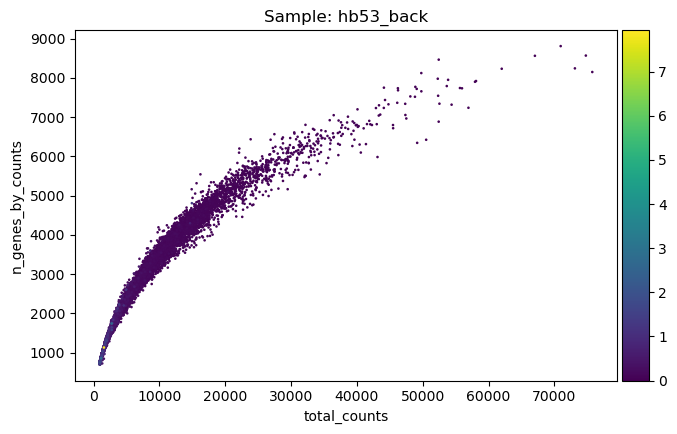

... storing 'sample' as categorical
... storing 'feature_types' as categorical


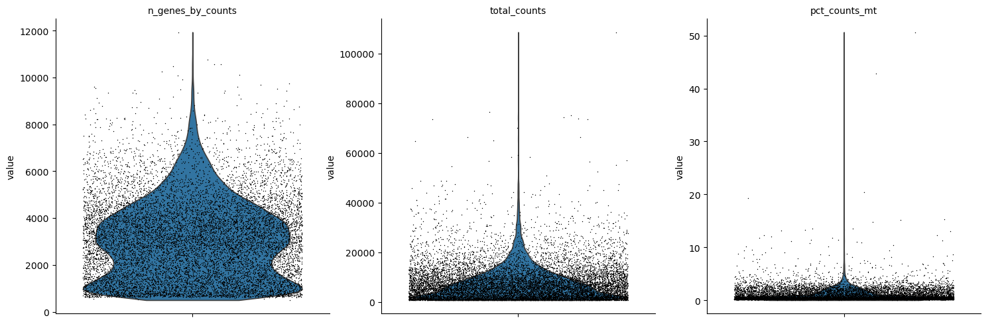

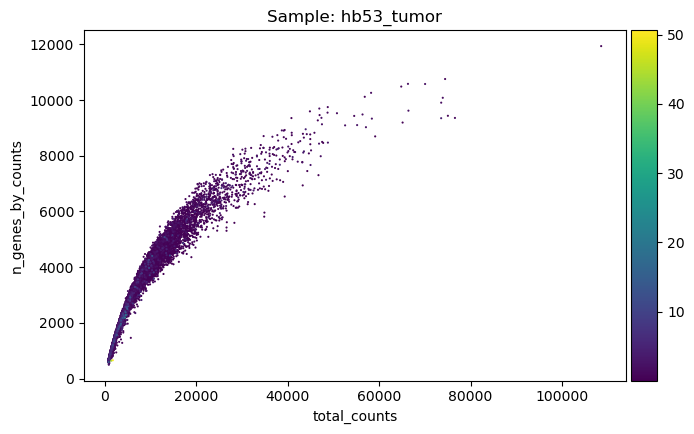

In [3]:
for sample_name, adata in adatas.items():
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True, log1p=True)
    sc.pl.violin(adata,["n_genes_by_counts", "total_counts", "pct_counts_mt"],jitter=0.4,multi_panel=True)
    sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt", title=f"Sample: {sample_name}")

## Filtering

In [4]:
for sample_name, adata in adatas.items():
    sc.pp.filter_cells(adatas[sample_name], min_counts=800)
    sc.pp.filter_cells(adatas[sample_name], min_genes=500)
    sc.pp.filter_cells(adatas[sample_name], max_counts=70000)
    sc.pp.filter_cells(adatas[sample_name], max_genes=10000)
    adatas[sample_name] = adata[adata.obs['pct_counts_mt'] < 10].copy()
    print(f"Sample {sample_name}: {adatas[sample_name].n_obs} cells remaining after all filtering")
    print(f"Sampel {sample_name}: {adatas[sample_name].n_vars} genes remaining after all filtering")

Sample hb17_pdx: 8015 cells remaining after all filtering
Sampel hb17_pdx: 33538 genes remaining after all filtering
Sample hb17_back: 1688 cells remaining after all filtering
Sampel hb17_back: 33538 genes remaining after all filtering
Sample hb17_tumor: 7992 cells remaining after all filtering
Sampel hb17_tumor: 33538 genes remaining after all filtering
Sample hb30_pdx: 10102 cells remaining after all filtering
Sampel hb30_pdx: 33538 genes remaining after all filtering
Sample hb30_tumor: 18733 cells remaining after all filtering
Sampel hb30_tumor: 33538 genes remaining after all filtering
Sample hb53_back: 8536 cells remaining after all filtering
Sampel hb53_back: 33538 genes remaining after all filtering
Sample hb53_tumor: 12786 cells remaining after all filtering
Sampel hb53_tumor: 33538 genes remaining after all filtering


In [5]:
for sample_name, adata in adatas.items():
    sc.pp.filter_genes(adata, min_cells=3)
    print(f"Sample {sample_name}: {adatas[sample_name].n_obs} cells remaining after all filtering")
    print(f"Sample {sample_name}: {adatas[sample_name].n_vars} genes remaining after all filtering")

Sample hb17_pdx: 8015 cells remaining after all filtering
Sample hb17_pdx: 25208 genes remaining after all filtering
Sample hb17_back: 1688 cells remaining after all filtering
Sample hb17_back: 17274 genes remaining after all filtering
Sample hb17_tumor: 7992 cells remaining after all filtering
Sample hb17_tumor: 25333 genes remaining after all filtering
Sample hb30_pdx: 10102 cells remaining after all filtering
Sample hb30_pdx: 25854 genes remaining after all filtering
Sample hb30_tumor: 18733 cells remaining after all filtering
Sample hb30_tumor: 26899 genes remaining after all filtering
Sample hb53_back: 8536 cells remaining after all filtering
Sample hb53_back: 25195 genes remaining after all filtering
Sample hb53_tumor: 12786 cells remaining after all filtering
Sample hb53_tumor: 26831 genes remaining after all filtering


Now, let's perform doublet detection

In [6]:
for sample_name, adata in adatas.items():
    print(f"\nProcessing sample: {sample_name}")
    if "counts" in adata.layers:
        counts_matrix = adata.layers["counts"]
    else:
        counts_matrix = adata.X.copy()
        
    scrub = scr.Scrublet(counts_matrix)
    
    doublet_scores, predicted_doublets = scrub.scrub_doublets()
    adata.obs['doublet_score'] = doublet_scores
    adata.obs['predicted_doublet'] = predicted_doublets
    
    plt.figure(figsize=(8, 6))
    scrub.plot_histogram()
    plt.savefig(f"./figures/doublet_histogram_{sample_name}.png")
    plt.close()
    n_doublets = sum(predicted_doublets)
    print(f"  Predicted doublets: {n_doublets} ({n_doublets/len(predicted_doublets)*100:.2f}%)")


Processing sample: hb17_pdx
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.77
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 0.0%
Elapsed time: 16.0 seconds
  Predicted doublets: 0 (0.00%)

Processing sample: hb17_back
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 1.5%
Estimated detectable doublet fraction = 23.7%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.5%
Elapsed time: 1.3 seconds
  Predicted doublets: 26 (1.54%)

Processing sample: hb17_tumor
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.69
Detected doublet rate = 0.0%
Estimated de

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

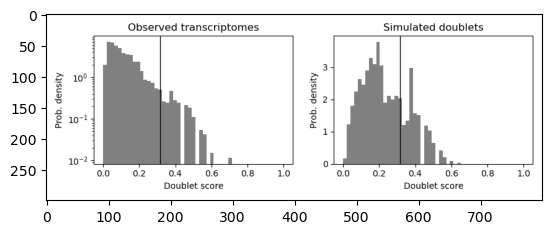

In [28]:
hb53_doublet = img.imread('./figures/doublet_histogram_hb53_tumor.png')
plt.imshow(hb53_doublet)

Based on scrublet, we can see that there is a great amount of doublets particularly in the hb53_tumor sample where it predicted around 618 doublets. Therefore let's perform further doublet filtering across the samples

In [7]:
sample_thresholds = {'hb17_pdx': 0.77,'hb17_back': 0.33,'hb17_tumor': 0.69,'hb30_pdx': 0.79,'hb30_tumor': 0.77,'hb53_back': 0.76,'hb53_tumor': 0.31}
filtered_adatas = {}

for sample_name, adata in adatas.items():
    print(f"\nProcessing sample: {sample_name}")
    
    threshold = sample_thresholds[sample_name]
    
    adata.obs['is_doublet'] = adata.obs['doublet_score'] > threshold
    
    filtered_adata = adata[~adata.obs['is_doublet']].copy()
    filtered_adatas[sample_name] = filtered_adata
    
    n_cells_before = adata.shape[0]
    n_cells_after = filtered_adata.shape[0]
    n_removed = n_cells_before - n_cells_after
    print(f"Sample: {sample_name}")
    print(f"Threshold: {threshold}")
    print(f"Cells before filtering: {n_cells_before}")
    print(f"Cells after filtering: {n_cells_after}")
    print(f"Cells removed: {n_removed} ({n_removed/n_cells_before*100:.2f}%)")


Processing sample: hb17_pdx
Sample: hb17_pdx
Threshold: 0.77
Cells before filtering: 8015
Cells after filtering: 8015
Cells removed: 0 (0.00%)

Processing sample: hb17_back
Sample: hb17_back
Threshold: 0.33
Cells before filtering: 1688
Cells after filtering: 1662
Cells removed: 26 (1.54%)

Processing sample: hb17_tumor
Sample: hb17_tumor
Threshold: 0.69
Cells before filtering: 7992
Cells after filtering: 7991
Cells removed: 1 (0.01%)

Processing sample: hb30_pdx
Sample: hb30_pdx
Threshold: 0.79
Cells before filtering: 10102
Cells after filtering: 10102
Cells removed: 0 (0.00%)

Processing sample: hb30_tumor
Sample: hb30_tumor
Threshold: 0.77
Cells before filtering: 18733
Cells after filtering: 18730
Cells removed: 3 (0.02%)

Processing sample: hb53_back
Sample: hb53_back
Threshold: 0.76
Cells before filtering: 8536
Cells after filtering: 8534
Cells removed: 2 (0.02%)

Processing sample: hb53_tumor
Sample: hb53_tumor
Threshold: 0.31
Cells before filtering: 12786
Cells after filtering: 

In [ ]:
for sample_name, adata in filtered_adatas.items():
    print(f"Sample {sample_name}: {filtered_adatas[sample_name].n_obs} cells remaining after all filtering")
    print(f"Sampel {sample_name}: {filtered_adatas[sample_name].n_vars} genes remaining after all filtering")

Sample hb17_pdx: 8015 cells remaining after all filtering
Sampel hb17_pdx: 25208 genes remaining after all filtering
Sample hb17_back: 1662 cells remaining after all filtering
Sampel hb17_back: 17274 genes remaining after all filtering
Sample hb17_tumor: 7991 cells remaining after all filtering
Sampel hb17_tumor: 25333 genes remaining after all filtering
Sample hb30_pdx: 10100 cells remaining after all filtering
Sampel hb30_pdx: 25854 genes remaining after all filtering
Sample hb30_tumor: 18727 cells remaining after all filtering
Sampel hb30_tumor: 26899 genes remaining after all filtering
Sample hb53_back: 8534 cells remaining after all filtering
Sampel hb53_back: 25195 genes remaining after all filtering
Sample hb53_tumor: 12099 cells remaining after all filtering
Sampel hb53_tumor: 26831 genes remaining after all filtering


In [33]:
filter_stats = {
    'Sample': [],
    'Cells Before': [],
    'Genes Before': [],
    'Cells After': [],
    'Genes After': [],
    'Cells Removed': [],
    'Cells Removed (%)': [],
    'Genes Removed': [],
    'Genes Removed (%)': []
}

before_stats = {
    'hb17_pdx': {'cells': 8027, 'genes': 33538},
    'hb17_back': {'cells': 11197, 'genes': 33538},
    'hb17_tumor': {'cells': 7995, 'genes': 33538},
    'hb30_pdx': {'cells': 10303, 'genes': 33538},
    'hb30_tumor': {'cells': 19042, 'genes': 33538},
    'hb53_back': {'cells': 8540, 'genes': 33538},
    'hb53_tumor': {'cells': 12832, 'genes': 33538}
}

after_stats = {
    'hb17_pdx': {'cells': 8015, 'genes': 25208},
    'hb17_back': {'cells': 1662, 'genes': 17274},
    'hb17_tumor': {'cells': 7991, 'genes': 25333},
    'hb30_pdx': {'cells': 10100, 'genes': 25854},
    'hb30_tumor': {'cells': 18727, 'genes': 26899},
    'hb53_back': {'cells': 8534, 'genes': 25195},
    'hb53_tumor': {'cells': 12099, 'genes': 26831}
}

for sample in before_stats.keys():
    cells_before = before_stats[sample]['cells']
    genes_before = before_stats[sample]['genes']
    cells_after = after_stats[sample]['cells']
    genes_after = after_stats[sample]['genes']
    cells_removed = cells_before - cells_after
    cells_removed_pct = (cells_removed / cells_before) * 100
    genes_removed = genes_before - genes_after
    genes_removed_pct = (genes_removed / genes_before) * 100
    filter_stats['Sample'].append(sample)
    filter_stats['Cells Before'].append(cells_before)
    filter_stats['Genes Before'].append(genes_before)
    filter_stats['Cells After'].append(cells_after)
    filter_stats['Genes After'].append(genes_after)
    filter_stats['Cells Removed'].append(cells_removed)
    filter_stats['Cells Removed (%)'].append(cells_removed_pct)
    filter_stats['Genes Removed'].append(genes_removed)
    filter_stats['Genes Removed (%)'].append(genes_removed_pct)

df = pd.DataFrame(filter_stats)
df['Cells Removed (%)'] = df['Cells Removed (%)'].apply(lambda x: f"{x:.1f}%" if isinstance(x, (int, float)) else x)
df['Genes Removed (%)'] = df['Genes Removed (%)'].apply(lambda x: f"{x:.1f}%" if isinstance(x, (int, float)) else x)
df

,Sample,Cells Before,Genes Before,Cells After,Genes After,Cells Removed,Cells Removed (%),Genes Removed,Genes Removed (%)
0,hb17_pdx,8027,33538,8015,25208,12,0.1%,8330,24.8%
1,hb17_back,11197,33538,1662,17274,9535,85.2%,16264,48.5%
2,hb17_tumor,7995,33538,7991,25333,4,0.1%,8205,24.5%
3,hb30_pdx,10303,33538,10100,25854,203,2.0%,7684,22.9%
4,hb30_tumor,19042,33538,18727,26899,315,1.7%,6639,19.8%
5,hb53_back,8540,33538,8534,25195,6,0.1%,8343,24.9%
6,hb53_tumor,12832,33538,12099,26831,733,5.7%,6707,20.0%


Preprocessing discussion

# Normalization

First let's combine the samples

In [79]:
adata_list = list(filtered_adatas.values())
sample_names = list(filtered_adatas.keys())

combined = ad.concat(adata_list, join='outer', label='sample', keys=sample_names)

In [80]:
combined

AnnData object with n_obs × n_vars = 67133 × 28347
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'is_doublet'

In [81]:
combined.layers['counts'] = combined.X.copy()
sc.pp.normalize_total(combined, target_sum=10000)
sc.pp.log1p(combined)

# Feature Selection

Let's extract the highly variable genes

In [82]:
sc.pp.highly_variable_genes(combined,flavor="seurat",n_top_genes=3000,batch_key="sample")
variable_genes_n = combined.var["highly_variable"].sum()
not_variable_n = 28347 - combined.var["highly_variable"].sum()
print(f'Number of highly variable genes: {variable_genes_n}')
print(f'Number of not highly variable genes: {not_variable_n}')

Number of highly variable genes: 3000
Number of not highly variable genes: 25347


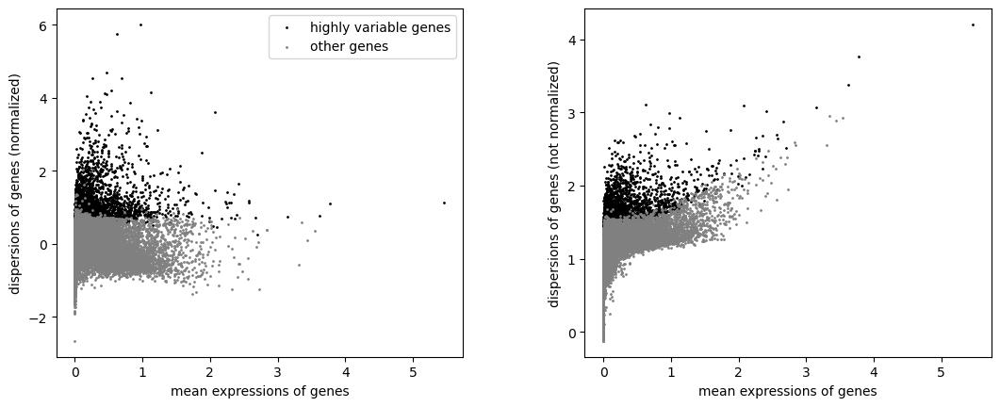

In [139]:
sc.pl.highly_variable_genes(combined, show=True)

In [83]:
filtered_combined = combined[:, combined.var.highly_variable]

# PCA

Now let's compute PCA on the log-normalized matrix

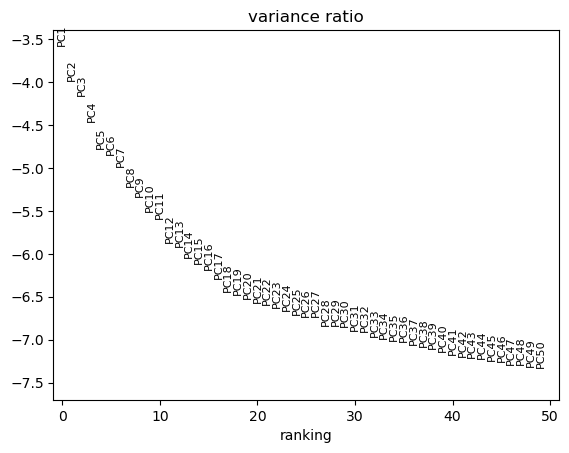

In [84]:
sc.pp.scale(filtered_combined)
sc.pp.pca(filtered_combined)
sc.pl.pca_variance_ratio(filtered_combined, n_pcs=50, log=True)

Based on the variance ratio plot, I think using between 20-30 principal components for the analysis. This plot shows the log variance ratio for each PC, and you're looking for the "elbow point" - where the curve starts to flatten out, indicating diminishing returns for including additional PCs. In your plot, there's a noticeable change in the slope around PC20-30. The first few PCs (1-10) show a steeper decline in variance ratio, suggesting they capture significant structure in your data. After approximately PC20, the curve becomes more gradual, indicating that additional PCs are capturing less meaningful variation and potentially more noise.

# Clustering and Visualization

In [85]:
sc.pp.neighbors(filtered_combined, n_pcs=30)
sc.tl.umap(filtered_combined, random_state=42)

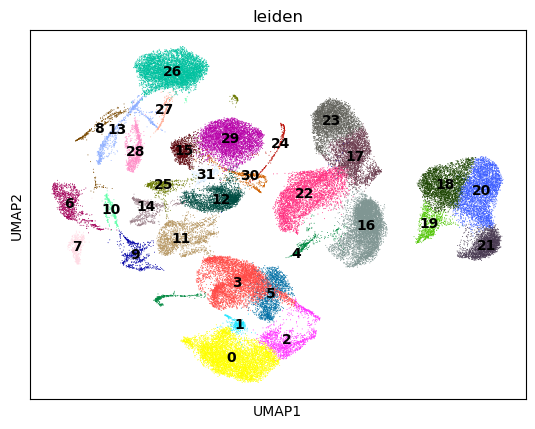

In [86]:
sc.tl.leiden(filtered_combined, flavor='igraph', n_iterations=2, random_state=42)
sc.pl.umap(filtered_combined, color=['leiden'], legend_loc='on data')

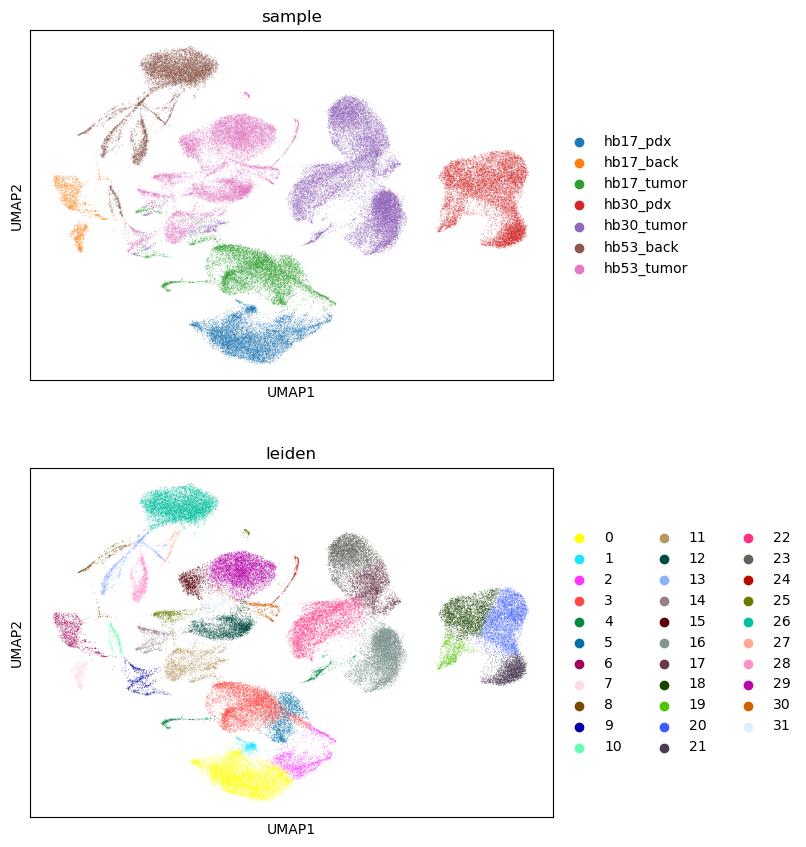

In [87]:
sc.pl.umap(filtered_combined, color=['sample', 'leiden'], alpha=0.5, ncols=1)

There is clearly a batch effect here since the cells are all separated based on the sample, therefore integration needs to be performed

# Integration

Here, let's use harmony to perform integration

In [88]:
filtered_combined_int = filtered_combined.copy()
ho = hm.run_harmony(filtered_combined_int.obsm['X_pca'], filtered_combined_int.obs, 'sample', random_state=42)
filtered_combined_int.obsm['X_pca_harmony'] = ho.Z_corr.T

2025-05-01 13:31:54,484 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-05-01 13:32:13,475 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-05-01 13:32:13,995 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-05-01 13:32:37,927 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-05-01 13:33:02,227 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-05-01 13:33:26,417 - harmonypy - INFO - Converged after 3 iterations
Converged after 3 iterations


In [89]:
sc.pp.neighbors(filtered_combined_int, use_rep='X_pca_harmony')
sc.tl.umap(filtered_combined_int, random_state=42)
sc.tl.leiden(filtered_combined_int, flavor='igraph', n_iterations=2, random_state=42)

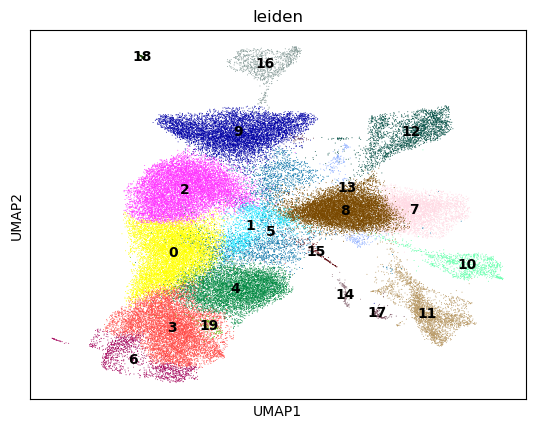

In [90]:
sc.pl.umap(filtered_combined_int, color=['leiden'], legend_loc='on data')

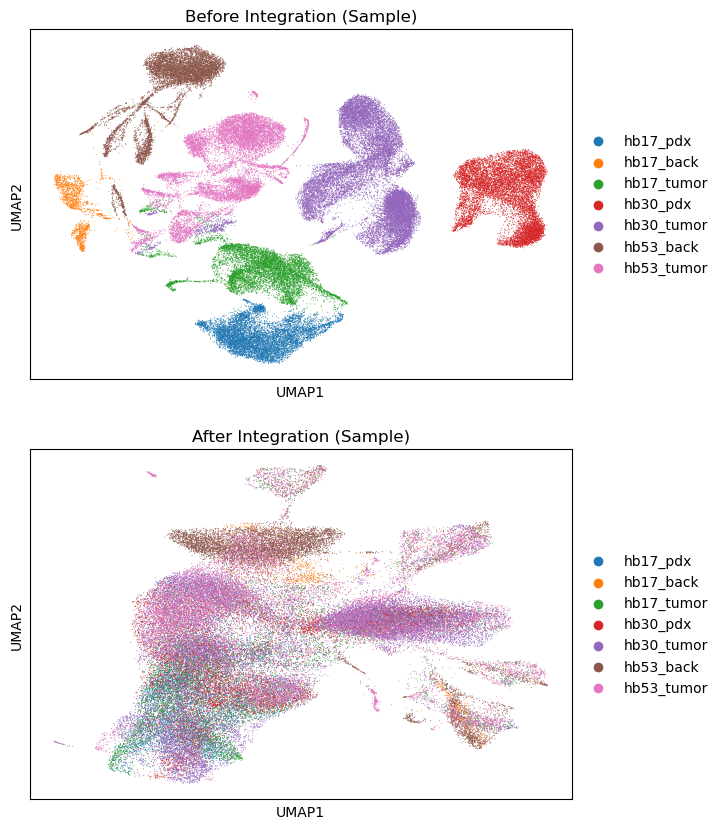

In [91]:
fig, ax = plt.subplots(2, 1, figsize=(7, 10))
sc.pl.umap(filtered_combined, color="sample", title="Before Integration (Sample)", show=False, ax=ax[0])
sc.pl.umap(filtered_combined_int, color="sample", title="After Integration (Sample)", show=False, ax=ax[1])
plt.show()

# Marker Gene Analysis

In [92]:
sc.tl.rank_genes_groups(filtered_combined_int, groupby="leiden", method="wilcoxon")

In [93]:
result = filtered_combined_int.uns['rank_genes_groups']
groups = result['names'].dtype.names

In [94]:
top_markers = pd.DataFrame()
for group in groups:
    genes = result['names'][group][:5]
    scores = result['scores'][group][:5]
    pvals = result['pvals'][group][:5]
    logfcs = result['logfoldchanges'][group][:5]
    
    cluster_markers = pd.DataFrame({
        'cluster': [group]*5,
        'gene': genes,
        'score': scores,
        'log2_fold_change': logfcs,
        'p_value': pvals
    })
    
    top_markers = pd.concat([top_markers, cluster_markers])

top_markers = top_markers.reset_index(drop=True)

In [95]:
top_markers

,cluster,gene,score,log2_fold_change,p_value
0,0,SNTG1,69.455437,NaN,0.000000e+00
1,0,SNAP25-AS1,68.556503,NaN,0.000000e+00
2,0,DCDC2,68.275414,NaN,0.000000e+00
3,0,PLCB1,63.881702,NaN,0.000000e+00
4,0,FRAS1,62.945038,NaN,0.000000e+00
...,...,...,...,...,...
95,19,AC098617.1,16.172094,NaN,7.935338e-59
96,19,NTM,15.200800,NaN,3.493274e-52
97,19,FGF13,14.546109,NaN,6.182052e-48
98,19,CACHD1,14.533796,NaN,7.400244e-48


In [96]:
marker_table = pd.pivot_table(
    top_markers, 
    values='gene', 
    index=None, 
    columns='cluster', 
    aggfunc=lambda x: ', '.join(x)
)
marker_table = marker_table.T
marker_table

,gene
cluster,
0,"SNTG1, SNAP25-AS1, DCDC2, PLCB1, FRAS1"
1,"NKD1, MT-CO3, AC105402.3, AFP, HS3ST5"
10,"PRKG1, IGFBP7, COL4A2, PDE3A, ZFPM2"
11,"TCF4, LDB2, ST6GALNAC3, PTPRB, FLT1"
12,"ZEB2, SLC8A1, CELF2, DOCK2, CHST11"
13,"ALB, AC105402.3, FTL, MT-CO1, FGB"
14,"HBB, SLC4A1, SLC25A37, SPTA1, ANK1"
15,"BICC1, GLIS3, PKHD1, STK39, DTNA"
16,"FYN, PTPRC, CELF2, PRKCH, ANKRD44"


# Cell Label Annotation - Automatic

In [97]:
combined_celltypist = filtered_combined_int.copy()
combined_celltypist.obs_names_make_unique()
combined_celltypist.var_names_make_unique()

In [158]:
models.models_description()

👉 Detailed model information can be found at `https://www.celltypist.org/models`


,model,description
0,Immune_All_Low.pkl,immune sub-populations combined from 20 tissue...
1,Immune_All_High.pkl,immune populations combined from 20 tissues of...
2,Adult_COVID19_PBMC.pkl,peripheral blood mononuclear cell types from C...
3,Adult_CynomolgusMacaque_Hippocampus.pkl,cell types from the hippocampus of adult cynom...
4,Adult_Human_MTG.pkl,cell types and subtypes (10x-based) from the a...
5,Adult_Human_PancreaticIslet.pkl,cell types from pancreatic islets of healthy a...
6,Adult_Human_PrefrontalCortex.pkl,cell types and subtypes from the adult human d...
7,Adult_Human_Skin.pkl,cell types from human healthy adult skin
8,Adult_Human_Vascular.pkl,vascular populations combined from multiple ad...
9,Adult_Mouse_Gut.pkl,cell types in the adult mouse gut combined fro...


In [98]:
ct = combined[:, combined.var.highly_variable]
combined_celltypist.X = ct.layers['counts']
sc.pp.normalize_total(combined_celltypist, target_sum=10000)
sc.pp.log1p(combined_celltypist)

In [99]:
predictions = celltypist.annotate(combined_celltypist, model = 'Healthy_Human_Liver.pkl', majority_voting = True)

🔬 Input data has 67133 cells and 3000 genes
🔗 Matching reference genes in the model
🧬 1051 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [100]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCCAAGGATTTGA-1,T cells,83,T cells
AAACCCAAGGTCGACA-1,Neutrophils,175,T cells
AAACCCAAGTGAGCCA-1,Endothelial cells,189,Endothelial cells
AAACCCAAGTGCGACA-1,Macrophages,4,T cells
AAACCCACAAATGCGG-1,Endothelial cells,41,Endothelial cells
...,...,...,...
TTTGTTGGTGCTTATG-1,Neutrophils,174,T cells
TTTGTTGGTGGACTGA-1,Hepatocytes,117,Fibroblasts
TTTGTTGGTTCATCTT-1,Macrophages,160,Macrophages
TTTGTTGGTTTCAGAC-1,Endothelial cells,86,Endothelial cells


In [101]:
filtered_combined_int.obs = filtered_combined_int.obs.join(predictions.predicted_labels)

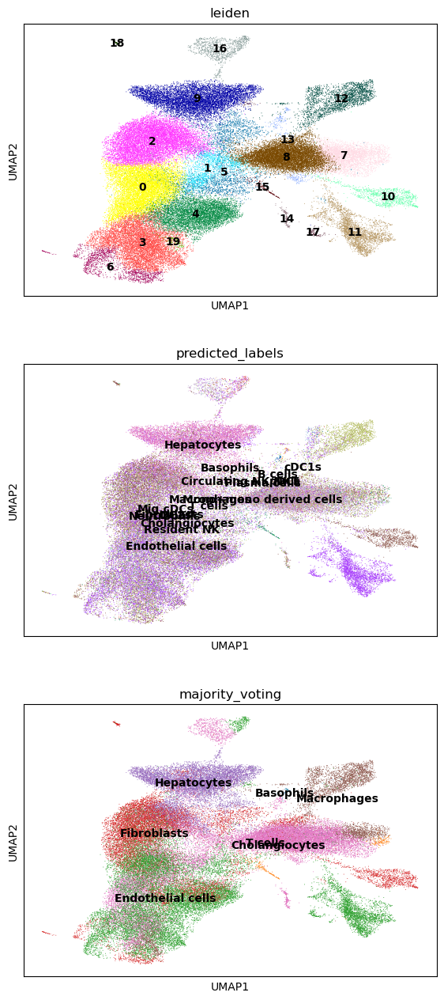

In [102]:
sc.pl.umap(filtered_combined_int, color=['leiden', 'predicted_labels', 'majority_voting'], legend_loc='on data', ncols=1)

# Cell Label Annotation - Manual

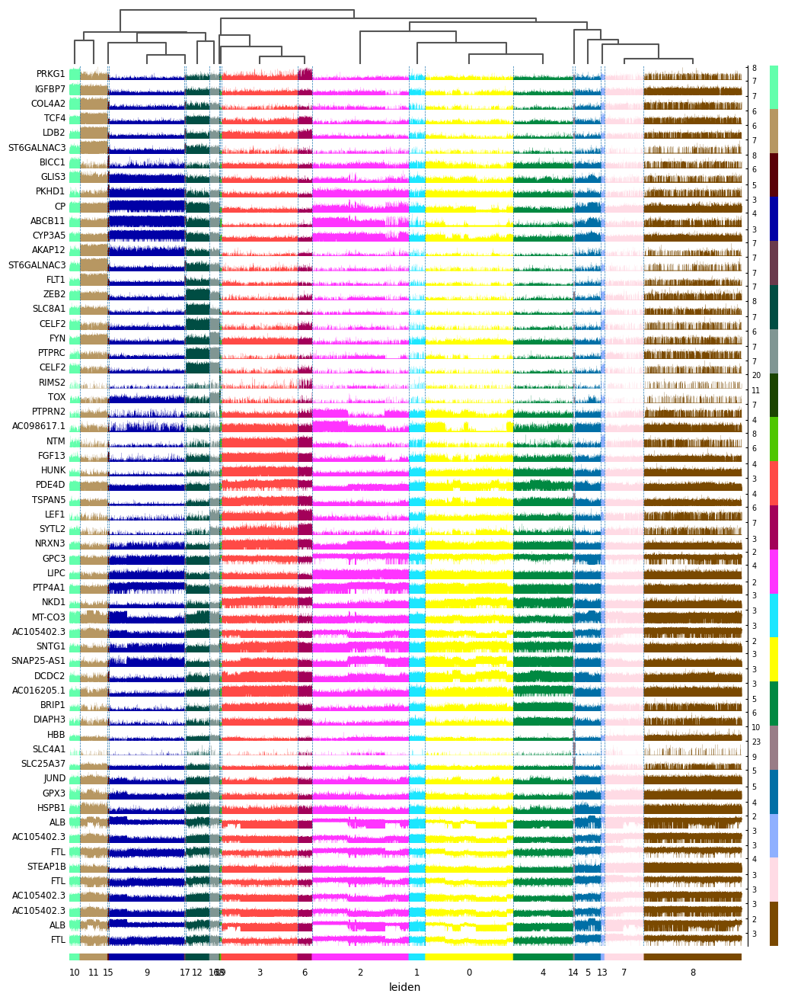

In [103]:
sc.pl.rank_genes_groups_tracksplot(filtered_combined_int, n_genes=3)

In [104]:
cluster_counts = filtered_combined_int.obs['leiden'].value_counts()
print(cluster_counts)

leiden
8     9758
2     9667
0     8784
3     7617
9     7501
4     5984
7     3931
11    2787
5     2600
12    2372
1     1651
6     1437
10    1031
16     983
13     370
14     166
15     150
17     143
19     127
18      74
Name: count, dtype: int64


In [107]:
top3_clusters = marker_table.iloc[[0,18,12]]
top3_clusters

,gene
cluster,
0,"SNTG1, SNAP25-AS1, DCDC2, PLCB1, FRAS1"
8,"AC105402.3, ALB, FTL, MT-CO3, MT-CO1"
2,"GPC3, LIPC, PTP4A1, NR1H4, SLC22A9"


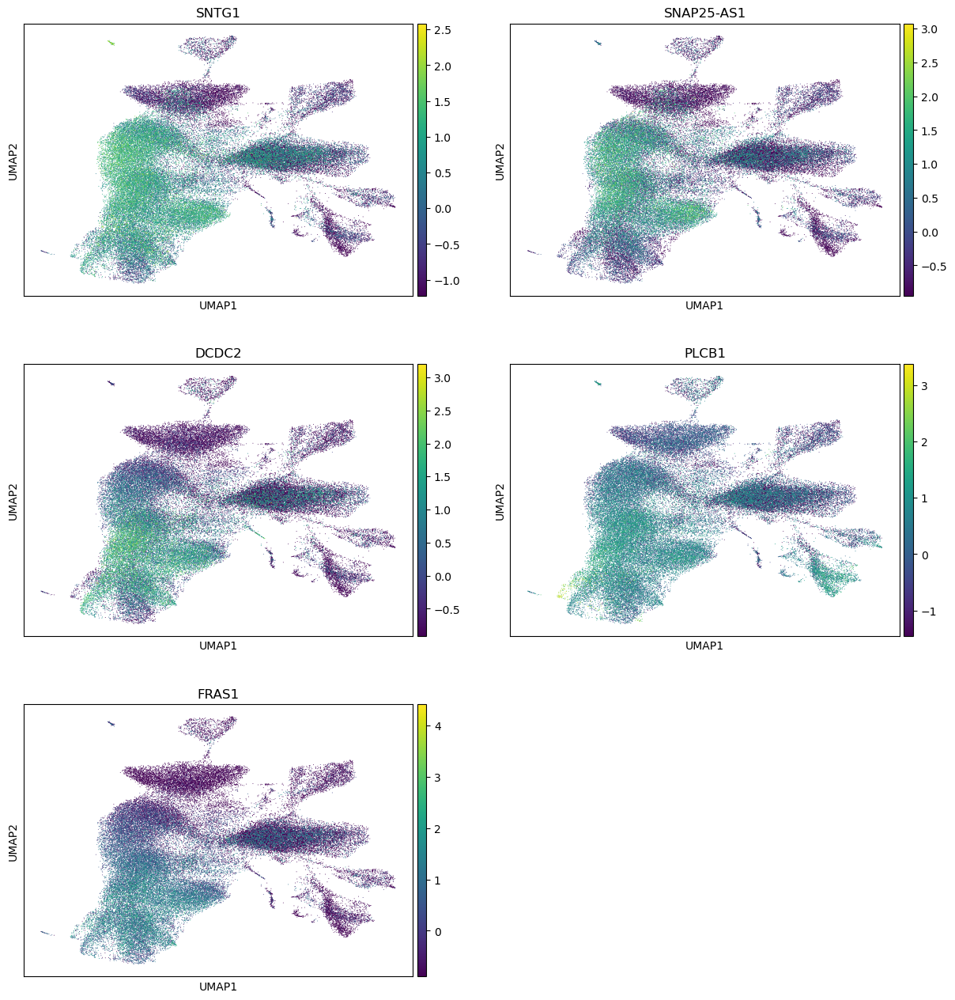

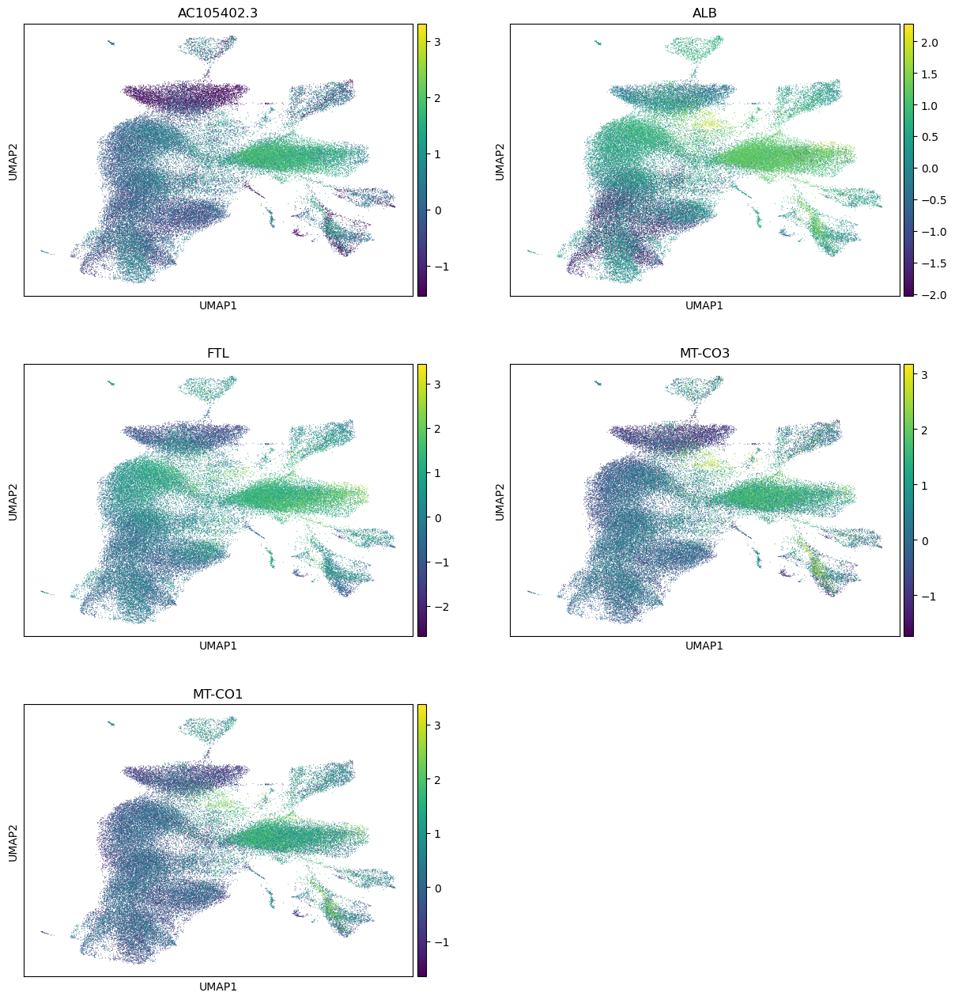

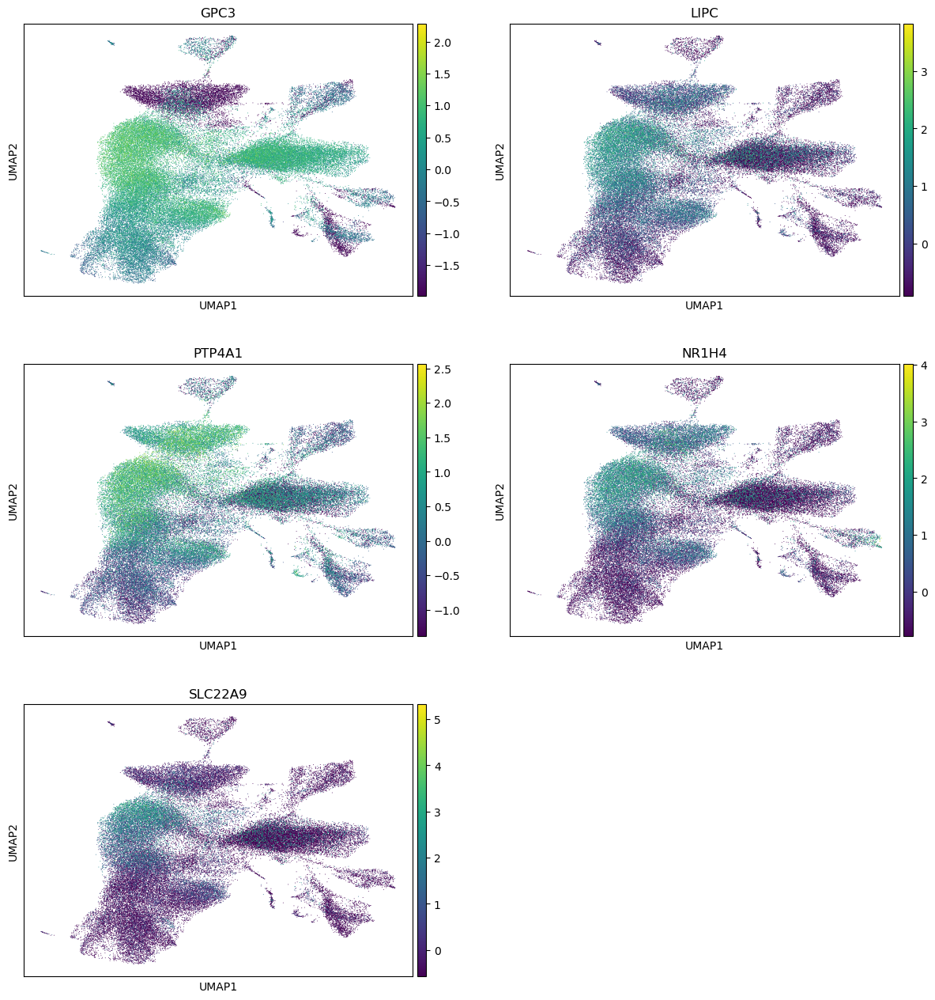

In [108]:
for index, row in top3_clusters.iterrows():
    gene_list = [g.strip() for g in row['gene'].split(',')]
    sc.pl.umap(filtered_combined_int, color=gene_list, ncols=2)

Manual Labeling

In [174]:
if 'cell' not in filtered_combined_int.obs:
    filtered_combined_int.obs['cell_type'] = None

filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '0'] = 'Epithelial/Mesenchymal cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '1'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '2'] = 'Fibroblasts'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '3'] = 'Epithelial/Mesenchymal cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '4'] = 'Epithelial/Mesenchymal cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '5'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '6'] = 'Epithelial/Mesenchymal cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '7'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '8'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '9'] = 'Hepatocytes'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '10'] = 'Stellate cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '11'] = 'Endothelial cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '12'] = 'Monocytes'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '13'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '14'] = 'Erythroid cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '15'] = 'Cholangiocytes'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '16'] = 'T cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '17'] = 'Tumor cells'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '18'] = 'Neurons'
filtered_combined_int.obs['cell_type'][filtered_combined_int.obs['leiden'] == '19'] = 'Epithelial/Mesenchymal cells'

... storing 'cell_type' as categorical


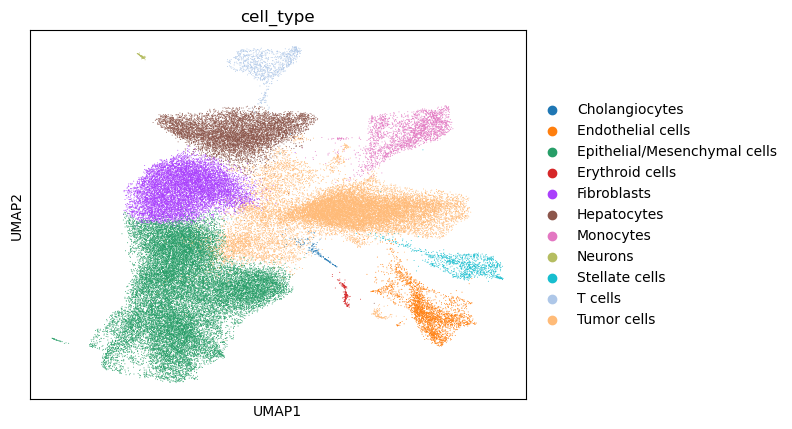

In [175]:
sc.pl.umap(filtered_combined_int, color='cell_type')

In [176]:
#filtered_combined_int.X = csr_matrix(filtered_combined_int.X)
filtered_combined_int.write("./all_samples_filtered.h5ad")

# Study Analysis 1 - Sample Correlation and Differential Gene Expression Analysis

Here let's perform correlation analysis first and see how related the samples are 

In [155]:
def extract_sample_type(sample_name):
    if 'back' in sample_name:
        return 'background'
    elif 'tumor' in sample_name:
        return 'tumor'
    elif 'pdx' in sample_name:
        return 'pdx'
    else:
        return 'unknown'

combined.obs['sample_type'] = combined.obs['sample'].apply(extract_sample_type)

In [145]:
def calculate_r_squared(x, y):
    model = LinearRegression()
    x_reshaped = x.reshape(-1, 1)
    model.fit(x_reshaped, y)
    r_squared = model.score(x_reshaped, y)
    return r_squared

def plot_pairwise_correlations(adata, groups, obs_key='sample_type', figsize=(16, 5)):
    
    pairs = [(0, 1), (1, 2), (0, 2)] 
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(1, 3, figure=fig)
    r_squared_values = {}
    
    # go through every pair
    for idx, (i, j) in enumerate(pairs):
        group1, group2 = groups[i], groups[j]
        pair_name = f"{group1} vs {group2}"
        mask1 = adata.obs[obs_key] == group1
        mask2 = adata.obs[obs_key] == group2
        if sum(mask1) == 0 or sum(mask2) == 0:
            print(f"Warning: One or both groups ({group1}, {group2}) not found in data")
            r_squared_values[pair_name] = np.nan
            continue
        
        # expression data
        expr1 = adata[mask1].X.mean(axis=0)
        expr2 = adata[mask2].X.mean(axis=0)
        if scipy.sparse.issparse(expr1):
            expr1 = expr1.toarray().flatten()
            expr2 = expr2.toarray().flatten()
        else:
            expr1 = np.array(expr1).flatten()
            expr2 = np.array(expr2).flatten()
        
        r_squared = calculate_r_squared(expr1, expr2)
        r_squared_values[pair_name] = r_squared
        
        ax = fig.add_subplot(gs[idx])
        ax.scatter(expr1, expr2, alpha=0.5, s=3, color=f'C{idx}')
        z = np.polyfit(expr1, expr2, 1)
        p = np.poly1d(z)
        x_range = np.linspace(min(expr1), max(expr1), 100)
        ax.plot(x_range, p(x_range), 'r-', linewidth=2)
        ax.set_xlabel(group1)
        ax.set_ylabel(group2)
        ax.set_title(f'{group1} vs {group2}\nR² = {r_squared:.3f}')
    
    plt.tight_layout()
    plt.show()
    
    return r_squared_values

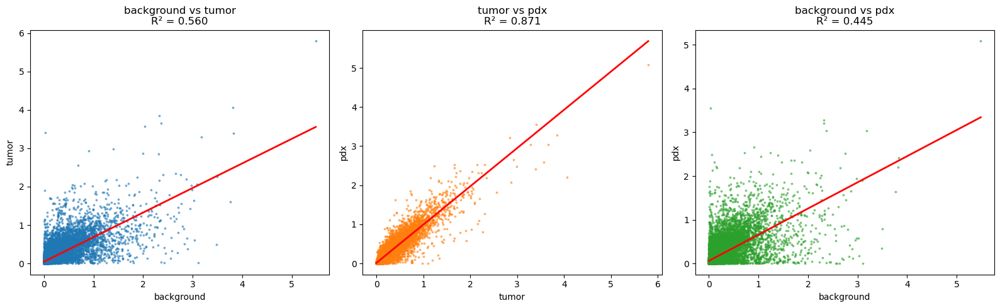


Gene Expression Correlation (R²) Results:
-----------------------------------------
background vs tumor: 0.5605
tumor vs pdx: 0.8710
background vs pdx: 0.4448


In [157]:
group_names = ['background', 'tumor', 'pdx']  
correlation_results = plot_pairwise_correlations(combined, group_names, obs_key='sample_type')
print("\nGene Expression Correlation (R²) Results:")
print("-----------------------------------------")
for pair, r2 in correlation_results.items():
    print(f"{pair}: {r2:.4f}")

From this correlation analysis, we can see that ...

<br>

Next, let's also perform differential gene expression analysis to see the specific differences

... storing 'sample_type' as categorical


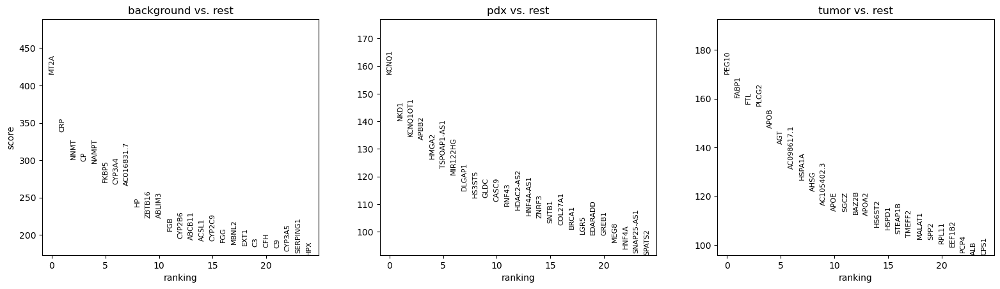

In [159]:
differential_genes = combined.copy()
sc.tl.rank_genes_groups(differential_genes, 'sample_type', method='t-test')
sc.pl.rank_genes_groups(differential_genes, n_genes=25, sharey=False)

... storing 'sample_type' as categorical
... storing 'sample_type' as categorical
... storing 'sample_type' as categorical



Top genes up in Tumor vs Background:
         names  logfoldchanges     pvals_adj
470   DLX6-AS1       28.174021  0.000000e+00
1341     REG3A       27.621876  3.204228e-97
1693      CCNO       27.417166  1.508562e-69
2011     KDM5D       26.865049  2.034881e-55
2420    EIF1AY       26.854610  7.831916e-40
2469     SRARP       26.704176  3.368367e-38
3013  HIST3H2A       26.409967  9.210455e-26
3378      DKK4       26.359919  6.221047e-20
4149      LHX1       25.956396  3.040114e-12
4332      DLX5       25.624067  1.057186e-10

Top genes up in PDX vs Background:
           names  logfoldchanges      pvals_adj
591     DLX6-AS1       28.637287   0.000000e+00
1382  AC109361.2       27.863989  2.627480e-153
3293        CCNO       26.888184   1.637466e-39
3621      EIF1AY       26.799307   1.243337e-32
3267       KDM5D       26.704100   2.555722e-40
4189        LHX1       26.579988   2.614564e-23
4024       SRARP       26.314228   1.129194e-25
4258    HAS2-AS1       26.143555   2.866084e-22

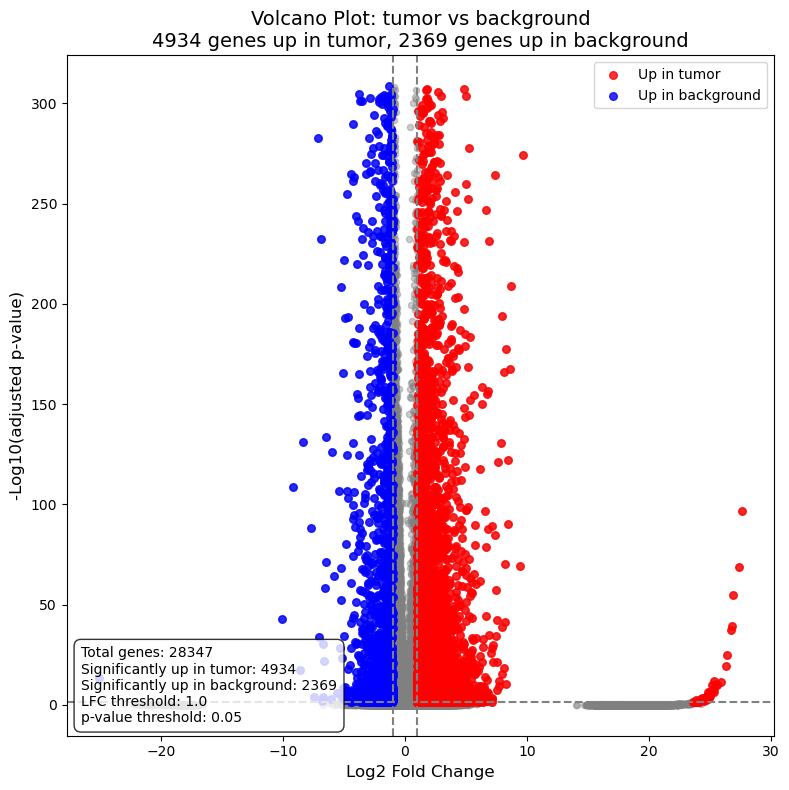

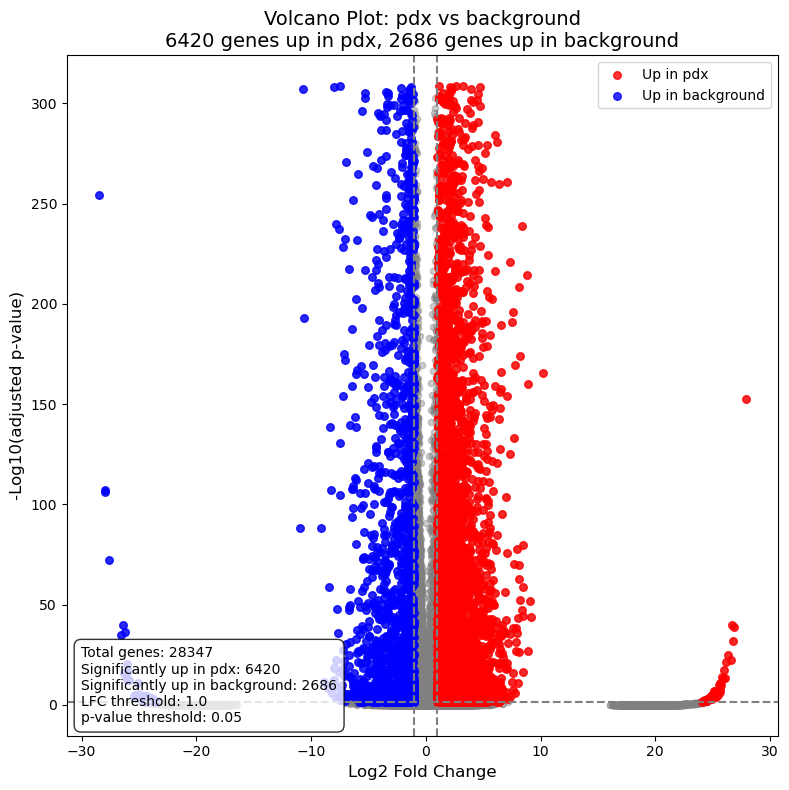

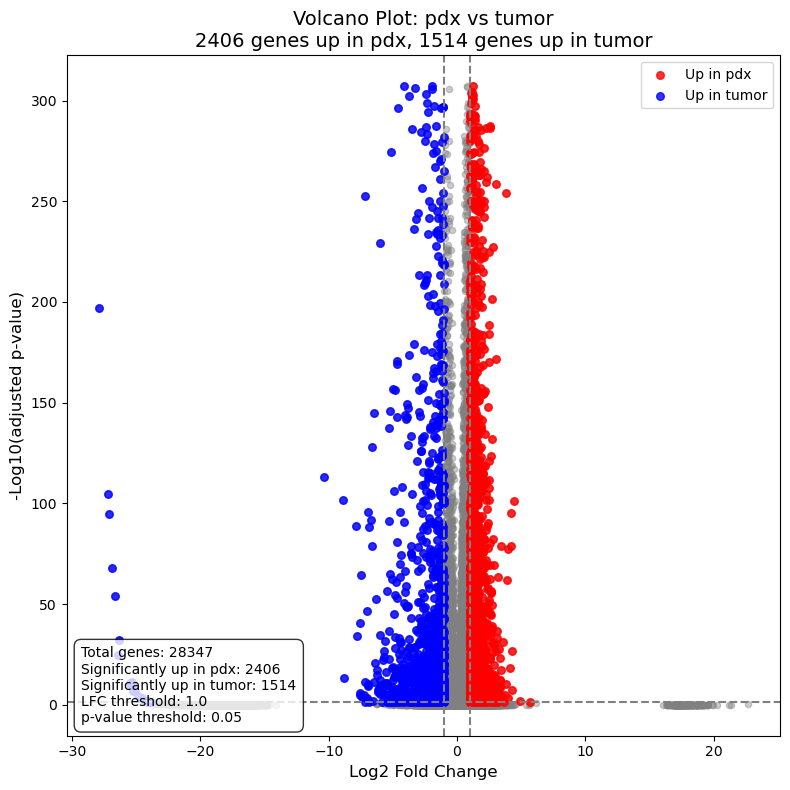

In [161]:
def generate_volcano_plot(adata, group1, group2, n_top_genes=15, lfc_threshold=1.0, pval_threshold=0.05):
    subset = adata[adata.obs['sample_type'].isin([group1, group2])].copy()
    sc.tl.rank_genes_groups(subset, 'sample_type', groups=[group2], reference=group1, method='wilcoxon')
    result = sc.get.rank_genes_groups_df(subset, group=group2)
    
    plt.figure(figsize=(8, 8))
    plt.scatter(result['logfoldchanges'],-np.log10(result['pvals_adj']),s=20, alpha=0.4, c='gray')
    significant = (abs(result['logfoldchanges']) > lfc_threshold) & (result['pvals_adj'] < pval_threshold)
    up_regulated = significant & (result['logfoldchanges'] > 0)
    down_regulated = significant & (result['logfoldchanges'] < 0)
    
    plt.scatter(result.loc[up_regulated, 'logfoldchanges'],-np.log10(result.loc[up_regulated,'pvals_adj']),s=30, alpha=0.8, c='red', label=f'Up in {group2}')
    plt.scatter(result.loc[down_regulated, 'logfoldchanges'],-np.log10(result.loc[down_regulated, 'pvals_adj']),s=30, alpha=0.8, c='blue', label=f'Up in {group1}')
    plt.axhline(-np.log10(pval_threshold), color='grey', linestyle='--')
    plt.axvline(lfc_threshold, color='grey', linestyle='--')
    plt.axvline(-lfc_threshold, color='grey', linestyle='--')

    result['abs_logfoldchanges'] = abs(result['logfoldchanges'])
    result['combined_score'] = -np.log10(result['pvals_adj']) * result['abs_logfoldchanges']
    top_genes = result[significant].sort_values('combined_score', ascending=False).head(n_top_genes)
    for _, row in top_genes.iterrows():
        plt.annotate(
            row['names'], 
            xy=(row['logfoldchanges'], -np.log10(row['pvals_adj'])),
            xytext=(5, 5), 
            textcoords='offset points',
            fontsize=11,
            fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.3)
        )
    
    n_up = sum(up_regulated)
    n_down = sum(down_regulated)
    plt.title(f'Volcano Plot: {group2} vs {group1}\n{n_up} genes up in {group2}, {n_down} genes up in {group1}', fontsize=14)
    plt.xlabel('Log2 Fold Change', fontsize=12)
    plt.ylabel('-Log10(adjusted p-value)', fontsize=12)
    plt.legend(fontsize=10, loc='best')
    stats_text = (
        f'Total genes: {len(result)}\n'
        f'Significantly up in {group2}: {n_up}\n'
        f'Significantly up in {group1}: {n_down}\n'
        f'LFC threshold: {lfc_threshold}\n'
        f'p-value threshold: {pval_threshold}'
    )
    plt.text(0.02, 0.02, stats_text, transform=plt.gca().transAxes,fontsize=10,bbox=dict(boxstyle='round,pad=0.5', fc='white', alpha=0.8))
    plt.tight_layout()
    return result

tumor_vs_background = generate_volcano_plot(combined, 'background', 'tumor')
pdx_vs_background = generate_volcano_plot(combined, 'background', 'pdx')
pdx_vs_tumor = generate_volcano_plot(combined, 'tumor', 'pdx')

print("\nTop genes up in Tumor vs Background:")
print(tumor_vs_background.sort_values('logfoldchanges', ascending=False).head(10)[['names', 'logfoldchanges', 'pvals_adj']])
print("\nTop genes up in PDX vs Background:")
print(pdx_vs_background.sort_values('logfoldchanges', ascending=False).head(10)[['names', 'logfoldchanges', 'pvals_adj']])
print("\nTop genes up in PDX vs Tumor:")
print(pdx_vs_tumor.sort_values('logfoldchanges', ascending=False).head(10)[['names', 'logfoldchanges', 'pvals_adj']])

# Study Analysis 2 - Cell Signaling Analysis

The study performed Cell Signaling Analysis only on the tumor and PDX samples to solely focus on tumor cells, so let's perform the analysis steps again excluding the background samples. Also since CellChat is an R package and we are working with scanpy, the liana module will be used as a subsitute instead.

In [113]:
adata_list = list(filtered_adatas.values())
sample_names = list(filtered_adatas.keys())

adata_tumor = [adata_list[i] for i in (0,2,3,4,6)]
sample_tumor = [sample_names[i] for i in (0,2,3,4,6)]

combined_tumor = ad.concat(adata_tumor, join='outer', label='sample', keys=sample_tumor)

In [114]:
combined_tumor

AnnData object with n_obs × n_vars = 56937 × 28208
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'is_doublet'

In [115]:
combined_tumor.layers['counts'] = combined_tumor.X.copy()
sc.pp.normalize_total(combined_tumor, target_sum=10000)
sc.pp.log1p(combined_tumor)

In [116]:
sc.pp.highly_variable_genes(combined_tumor,flavor="seurat",n_top_genes=3000,batch_key="sample")
variable_genes_n = combined_tumor.var["highly_variable"].sum()
not_variable_n = 28347 - combined_tumor.var["highly_variable"].sum()
print(f'Number of highly variable genes: {variable_genes_n}')
print(f'Number of not highly variable genes: {not_variable_n}')

Number of highly variable genes: 3000
Number of not highly variable genes: 25347


In [117]:
filtered_combined_tumor = combined_tumor[:, combined_tumor.var.highly_variable]

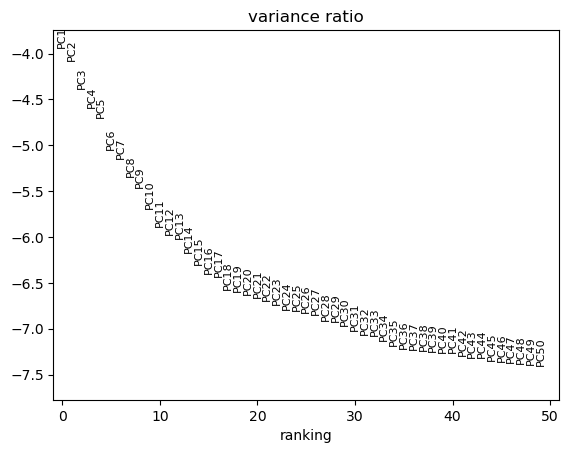

In [118]:
sc.pp.scale(filtered_combined_tumor)
sc.pp.pca(filtered_combined_tumor)
sc.pl.pca_variance_ratio(filtered_combined_tumor, n_pcs=50, log=True)

In [119]:
sc.pp.neighbors(filtered_combined_tumor, n_pcs=30)
sc.tl.umap(filtered_combined_tumor, random_state=42)

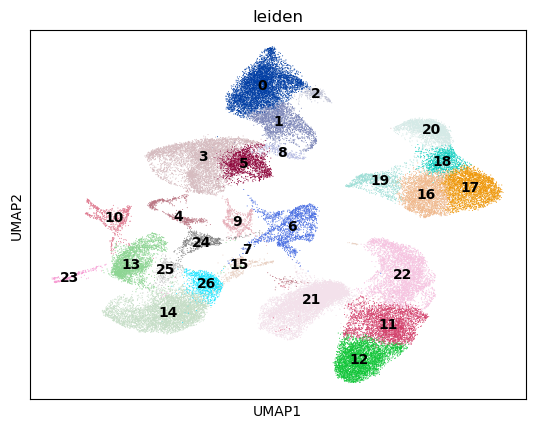

In [120]:
sc.tl.leiden(filtered_combined_tumor, flavor='igraph', n_iterations=2, random_state=42)
sc.pl.umap(filtered_combined_tumor, color=['leiden'], legend_loc='on data')

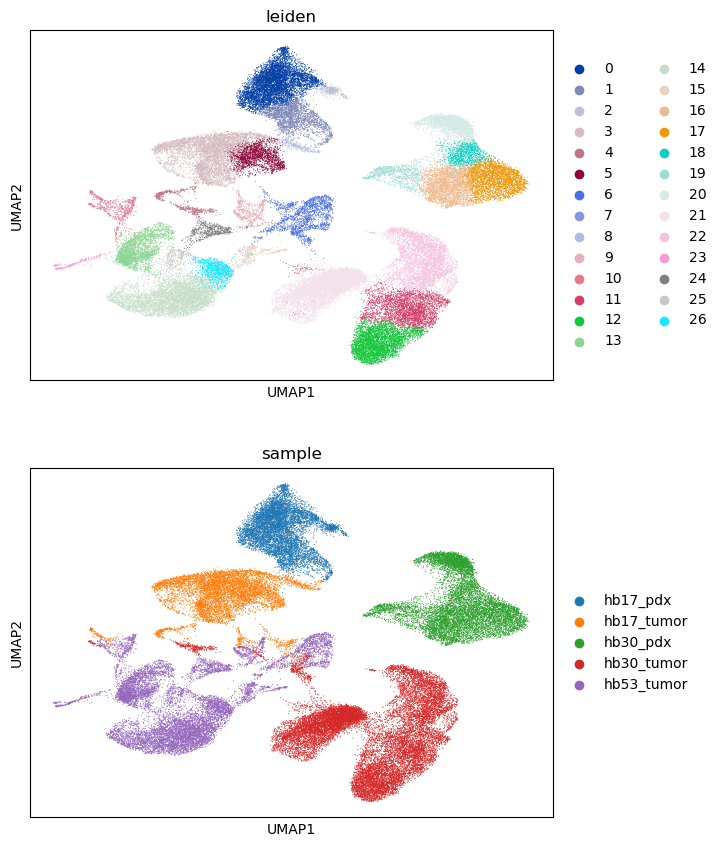

In [121]:
sc.pl.umap(filtered_combined_tumor, color=['leiden','sample'], ncols=1)

In [122]:
filtered_combined_tumor_int = filtered_combined_tumor.copy()
ho = hm.run_harmony(filtered_combined_tumor_int.obsm['X_pca'], filtered_combined_tumor_int.obs, 'sample', random_state=42)
filtered_combined_tumor_int.obsm['X_pca_harmony'] = ho.Z_corr.T

2025-05-01 14:05:10,500 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-05-01 14:05:26,738 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-05-01 14:05:27,302 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-05-01 14:05:47,202 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-05-01 14:06:07,299 - harmonypy - INFO - Converged after 2 iterations
Converged after 2 iterations


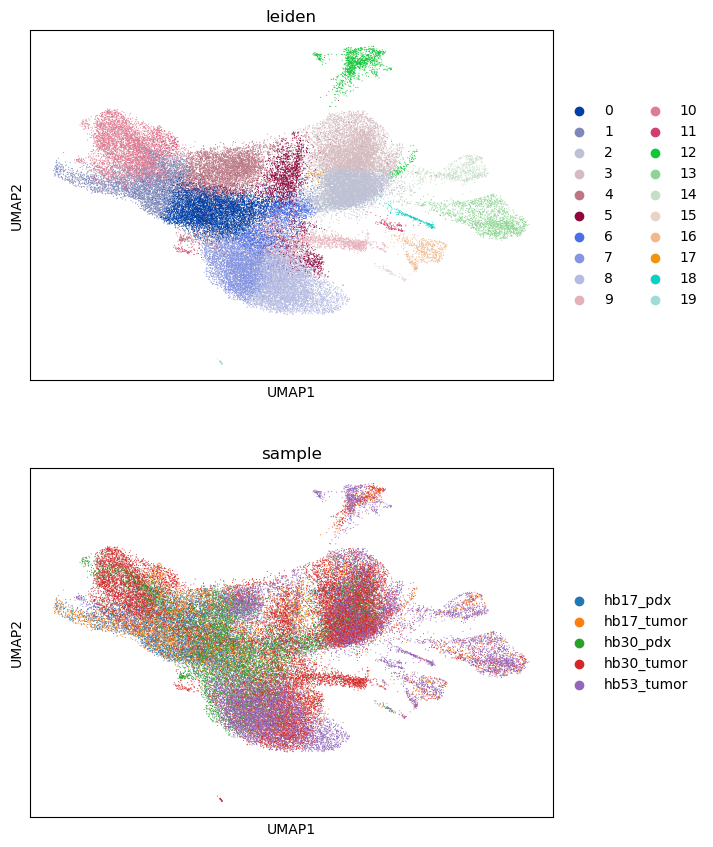

In [123]:
sc.pp.neighbors(filtered_combined_tumor_int, use_rep='X_pca_harmony')
sc.tl.umap(filtered_combined_tumor_int, random_state=42)
sc.tl.leiden(filtered_combined_tumor_int, flavor='igraph', n_iterations=2, random_state=42)
sc.pl.umap(filtered_combined_tumor_int, color=['leiden','sample'], ncols=1)

In [177]:
sc.tl.rank_genes_groups(filtered_combined_tumor_int, groupby="leiden", method="wilcoxon")
result_tumor = filtered_combined_tumor_int.uns['rank_genes_groups']
groups_tumor = result_tumor['names'].dtype.names
top_markers_tumor = pd.DataFrame()

for group in groups_tumor:
    genes = result_tumor['names'][group][:5]
    scores = result_tumor['scores'][group][:5]
    pvals = result_tumor['pvals'][group][:5]
    logfcs = result_tumor['logfoldchanges'][group][:5]
    
    cluster_markers_tumor = pd.DataFrame({
        'cluster': [group]*5,
        'gene': genes,
        'score': scores,
        'log2_fold_change': logfcs,
        'p_value': pvals
    })
    
    top_markers_tumor = pd.concat([top_markers_tumor, cluster_markers_tumor])

top_markers_tumor = top_markers_tumor.reset_index(drop=True)

marker_table_tumor = pd.pivot_table(
    top_markers_tumor, 
    values='gene', 
    index=None, 
    columns='cluster', 
    aggfunc=lambda x: ', '.join(x)
)
marker_table_tumor = marker_table_tumor.T
marker_table_tumor

,gene
cluster,
0,"NKD1, HS3ST5, HS3ST4, SNAP25-AS1, DLGAP1"
1,"HS3ST4, KIZ, NKD1, PDE4D, TSPAN5"
10,"CACHD1, FNDC3A, HUNK, PRICKLE2, FGF13"
11,"PTPRN2, AUTS2, TRPM3, SHISA6, NAV2"
12,"TCF4, NFIB, LDB2, CALCRL, COL4A1"
13,"ZEB2, SLC8A1, PLXDC2, DOCK2, RBM47"
14,"PRKG1, IGFBP7, CACNA1C, PDE3A, COL4A2"
15,"KIT, HDC, SLC24A3, HPGD, CPA3"
16,"PTPRC, CELF2, PRKCH, ANKRD44, FYN"


In [124]:
combined_celltypist_tumor = filtered_combined_tumor_int.copy()
combined_celltypist_tumor.obs_names_make_unique()
combined_celltypist_tumor.var_names_make_unique()
ct = combined_tumor[:, combined_tumor.var.highly_variable]
combined_celltypist_tumor.X = ct.layers['counts']
sc.pp.normalize_total(combined_celltypist_tumor, target_sum=10000)
sc.pp.log1p(combined_celltypist_tumor)

In [125]:
predictions = celltypist.annotate(combined_celltypist_tumor, model = 'Healthy_Human_Liver.pkl', majority_voting = True)

🔬 Input data has 56937 cells and 3000 genes
🔗 Matching reference genes in the model
🧬 974 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [126]:
predictions.predicted_labels

,predicted_labels,over_clustering,majority_voting
AAACCCAAGGATTTGA-1,T cells,11,T cells
AAACCCAAGGTCGACA-1,Neutrophils,253,T cells
AAACCCAAGTGAGCCA-1,Endothelial cells,142,T cells
AAACCCAAGTGCGACA-1,Cholangiocytes,99,T cells
AAACCCACAAATGCGG-1,Mono+mono derived cells,317,Mono+mono derived cells
...,...,...,...
TTTGTTGGTGCTTATG-1,Neutrophils,299,Mono+mono derived cells
TTTGTTGGTGGACTGA-1,Hepatocytes,192,Fibroblasts
TTTGTTGGTTCATCTT-1,Macrophages,74,Macrophages
TTTGTTGGTTTCAGAC-1,Endothelial cells,184,Endothelial cells


In [127]:
filtered_combined_tumor_int.obs = filtered_combined_tumor_int.obs.join(predictions.predicted_labels)

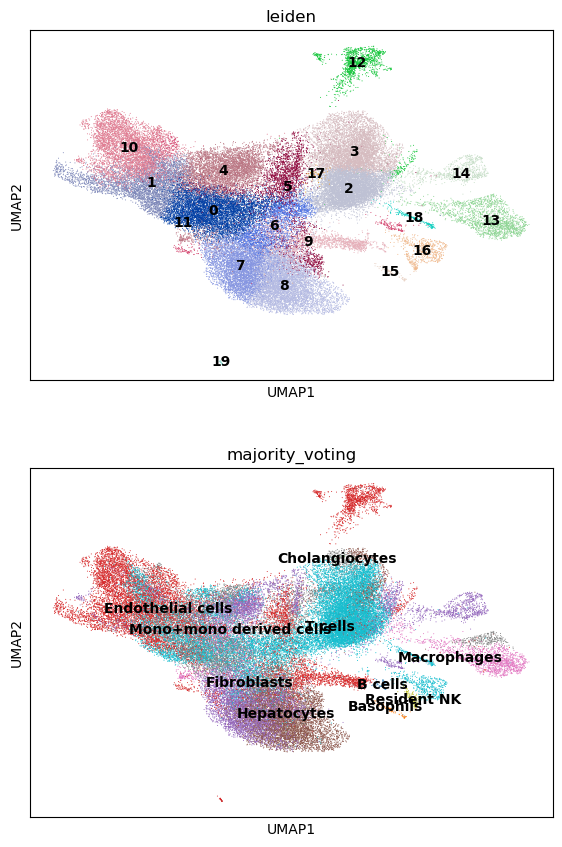

In [128]:
sc.pl.umap(filtered_combined_tumor_int, color=['leiden', 'majority_voting'], ncols=1, legend_loc='on data')

In [178]:
marker_table_tumor

,gene
cluster,
0,"NKD1, HS3ST5, HS3ST4, SNAP25-AS1, DLGAP1"
1,"HS3ST4, KIZ, NKD1, PDE4D, TSPAN5"
10,"CACHD1, FNDC3A, HUNK, PRICKLE2, FGF13"
11,"PTPRN2, AUTS2, TRPM3, SHISA6, NAV2"
12,"TCF4, NFIB, LDB2, CALCRL, COL4A1"
13,"ZEB2, SLC8A1, PLXDC2, DOCK2, RBM47"
14,"PRKG1, IGFBP7, CACNA1C, PDE3A, COL4A2"
15,"KIT, HDC, SLC24A3, HPGD, CPA3"
16,"PTPRC, CELF2, PRKCH, ANKRD44, FYN"


In [186]:
marker_table

,gene
cluster,
0,"SNTG1, SNAP25-AS1, DCDC2, PLCB1, FRAS1"
1,"NKD1, MT-CO3, AC105402.3, AFP, HS3ST5"
10,"PRKG1, IGFBP7, COL4A2, PDE3A, ZFPM2"
11,"TCF4, LDB2, ST6GALNAC3, PTPRB, FLT1"
12,"ZEB2, SLC8A1, CELF2, DOCK2, CHST11"
13,"ALB, AC105402.3, FTL, MT-CO1, FGB"
14,"HBB, SLC4A1, SLC25A37, SPTA1, ANK1"
15,"BICC1, GLIS3, PKHD1, STK39, DTNA"
16,"FYN, PTPRC, CELF2, PRKCH, ANKRD44"


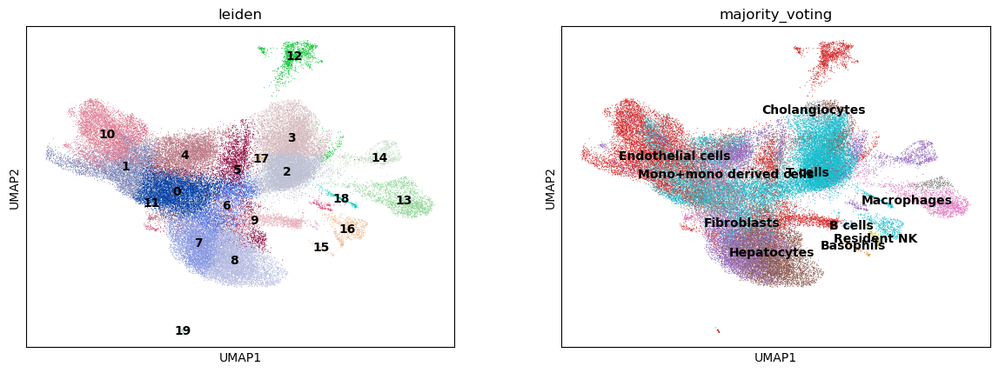

In [184]:
sc.pl.umap(filtered_combined_tumor_int, color=['leiden', 'majority_voting'], legend_loc='on data')

In [ ]:
filtered_combined_tumor_int.X = csr_matrix(filtered_combined_tumor_int.X)
filtered_combined_tumor_int.write("./tumor_samples_filtered.h5ad")

Manual labelling

In [3]:
if 'cell_type' not in filtered_combined_tumor_int.obs:
    filtered_combined_tumor_int.obs['cell_type'] = None

filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '0'] = 'Epithelial/Mesenchymal cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '1'] = 'Epithelial/Mesenchymal cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '2'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '3'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '4'] = 'Epithelial/Mesenchymal cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '5'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '6'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '7'] = 'Hepatocytes'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '8'] = 'Hepatocytes'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '9'] = 'Hepatocytes'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '10'] = 'Epithelial/Mesenchymal cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '11'] = 'Neurons'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '12'] = 'Endothelial cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '13'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '14'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '15'] = 'Mast cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '16'] = 'T cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '17'] = 'Tumor cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '18'] = 'Erythroid cells'
filtered_combined_tumor_int.obs['cell_type'][filtered_combined_tumor_int.obs['leiden'] == '19'] = 'Epithelial/Mesenchymal cells'

In [2]:
filtered_combined_tumor_int = ad.read_h5ad('./tumor_samples_filtered.h5ad')

... storing 'cell_type' as categorical


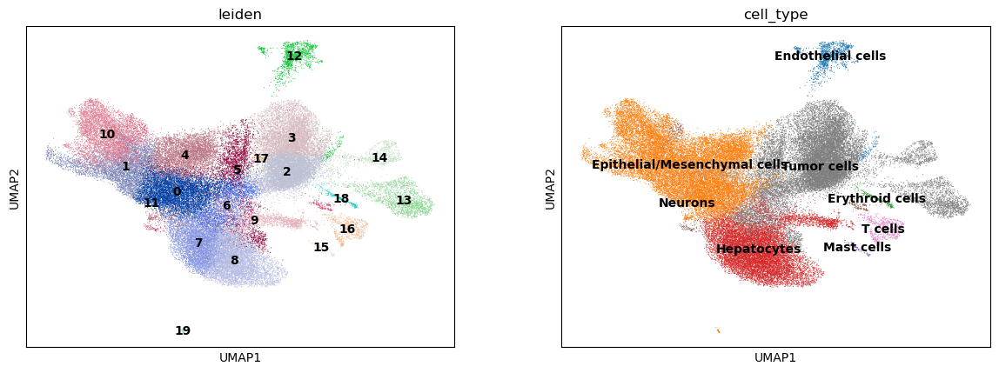

In [10]:
sc.pl.umap(filtered_combined_tumor_int, color=['leiden', 'cell_type'], legend_loc='on data')

Now that we have the clusters for the tumor samples, let's perform liana cell signalling analysis

In [23]:
def run_liana_analysis(adata, cluster_key='cell_type'):
    print(f"Running LIANA with cluster key: {cluster_key}")
    
    if cluster_key not in adata.obs.columns:
        raise ValueError(f"Cluster key '{cluster_key}' not found in adata.obs")

    liana.method.rank_aggregate(
        adata,
        groupby=cluster_key,
        use_raw=False  # Change to True if you want raw counts
    )

    if 'liana_res' not in adata.uns:
        raise RuntimeError("LIANA analysis failed: 'liana_res' not found in adata.uns")
    
    print(f"LIANA analysis complete. Found {len(adata.uns['liana_res'])} ligand-receptor pairs.")
    return adata

# 3. Create a cell-cell communication matrix - UPDATED
def create_communication_matrix(liana_result, cluster_key='cell_type'):
    """Create a cell-cell communication matrix from LIANA results"""
    lr_scores = liana_result.uns['liana_res']

    source_col = 'source'
    target_col = 'target'
    
    clusters = sorted(list(set(
        lr_scores[source_col].unique().tolist() +
        lr_scores[target_col].unique().tolist()
    )))
    
    # Initialize matrices
    count_matrix = pd.DataFrame(0, index=clusters, columns=clusters)
    score_matrix = pd.DataFrame(0.0, index=clusters, columns=clusters)
    
    # Use 'specificity_rank' instead of 'aggregate_rank'
    score_col = 'specificity_rank'
    print(f"Using '{score_col}' for scoring")
    
    for _, row in lr_scores.iterrows():
        source = row[source_col]
        target = row[target_col]
        
        # Skip rows with NaN values
        if pd.isna(row[score_col]):
            continue
            
        # For rank columns (lower is better), invert the score
        score = 1 - (row[score_col])  # Already normalized between 0-1
        
        count_matrix.loc[source, target] += 1
        score_matrix.loc[source, target] += score
    
    return count_matrix, score_matrix


# 4. Extract communication patterns (similar to CellChat's approach)
def extract_communication_patterns(comm_matrix, n_patterns=4, method='nmf'):
    """Extract communication patterns from the communication matrix"""
    # Method 1: Non-negative Matrix Factorization (NMF)
    if method.lower() == 'nmf':
        # Apply NMF to extract patterns
        model = NMF(n_components=n_patterns, init='random', random_state=42)
        W = model.fit_transform(comm_matrix.values)
        H = model.components_
        
        # Create DataFrames
        incoming_patterns = pd.DataFrame(
            W, 
            index=comm_matrix.index, 
            columns=[f'Pattern {i+1}' for i in range(n_patterns)]
        )
        
        outgoing_patterns = pd.DataFrame(
            H.T, 
            index=comm_matrix.columns, 
            columns=[f'Pattern {i+1}' for i in range(n_patterns)]
        )
    
    # Method 2: K-means clustering (alternative to NMF)
    elif method.lower() == 'kmeans':
        # For incoming patterns
        kmeans_in = KMeans(n_clusters=n_patterns, random_state=42)
        clusters_in = kmeans_in.fit_predict(comm_matrix.values)
        
        # For outgoing patterns
        kmeans_out = KMeans(n_clusters=n_patterns, random_state=42)
        clusters_out = kmeans_out.fit_predict(comm_matrix.values.T)
        
        # Create pattern matrices
        incoming_patterns = pd.DataFrame(0, 
                                       index=comm_matrix.index, 
                                       columns=[f'Pattern {i+1}' for i in range(n_patterns)])
        
        outgoing_patterns = pd.DataFrame(0, 
                                       index=comm_matrix.columns, 
                                       columns=[f'Pattern {i+1}' for i in range(n_patterns)])
        
        # Fill the matrices
        for i, cluster in enumerate(clusters_in):
            incoming_patterns.iloc[i, cluster] = 1
            
        for i, cluster in enumerate(clusters_out):
            outgoing_patterns.iloc[i, cluster] = 1
    
    else:
        raise ValueError(f"Unknown method: {method}. Use 'nmf' or 'kmeans'.")
        
    return incoming_patterns, outgoing_patterns

# 5. Extract pathway patterns - UPDATED
def extract_pathway_patterns(liana_result, n_patterns=4):
    """Extract pathway patterns from LIANA results"""
    lr_scores = liana_result.uns['liana_res']
    
    # No 'pathway' column, so create a synthetic one using ligand-receptor complexes
    lr_scores['pathway'] = lr_scores['ligand_complex'] + '-' + lr_scores['receptor_complex']
    pathway_col = 'pathway'
    
    source_col = 'source'
    target_col = 'target'
    
    top_pathways = lr_scores[pathway_col].value_counts().head(15).index.tolist()

    # Create a pathway × cell-type matrix
    unique_cell_types = sorted(list(set(
        lr_scores[source_col].unique().tolist() +
        lr_scores[target_col].unique().tolist()
    )))
    
    pathway_cell_matrix = pd.DataFrame(0, index=top_pathways, columns=unique_cell_types)

    for _, row in lr_scores.iterrows():
        if row[pathway_col] in top_pathways:
            pathway_cell_matrix.loc[row[pathway_col], row[source_col]] += 1
            pathway_cell_matrix.loc[row[pathway_col], row[target_col]] += 1

    # NMF
    model = NMF(n_components=n_patterns, init='random', random_state=42)
    W = model.fit_transform(pathway_cell_matrix.values + 0.1)
    
    pathway_matrix = pd.DataFrame(
        W,
        index=top_pathways,
        columns=[f'Pattern {i+1}' for i in range(n_patterns)]
    )
    
    return pathway_matrix


# 6. Visualize the results similar to Figure 7a
def plot_cellchat_like_patterns(incoming_patterns, outgoing_patterns, pathway_matrix, 
                              figsize=(14, 12), save_path='./figures/cell_signaling_patterns.png'):
    """Create a visualization similar to Figure 7a"""
    # Create hierarchical clustering for better visualization
    incoming_ordered = incoming_patterns.iloc[
        sns.clustermap(incoming_patterns).dendrogram_row.reordered_ind, :]
    outgoing_ordered = outgoing_patterns.iloc[
        sns.clustermap(outgoing_patterns).dendrogram_row.reordered_ind, :]
    pathway_ordered = pathway_matrix.iloc[
        sns.clustermap(pathway_matrix).dendrogram_row.reordered_ind, :]
    
    # Create figure
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    
    # Incoming cell patterns
    sns.heatmap(incoming_ordered, cmap='viridis', ax=axes[0, 0], 
              cbar_kws={'label': 'Contributions'})
    axes[0, 0].set_title('Cell patterns (Incoming)')
    axes[0, 0].set_xlabel('Patterns')
    axes[0, 0].set_ylabel('Cell Types')
    
    # Incoming communication patterns
    sns.heatmap(pathway_ordered, cmap='viridis', ax=axes[0, 1],
              cbar_kws={'label': 'Contributions'})
    axes[0, 1].set_title('Communication patterns (Incoming)')
    axes[0, 1].set_xlabel('Patterns')
    axes[0, 1].set_ylabel('Pathways')
    
    # Outgoing cell patterns
    sns.heatmap(outgoing_ordered, cmap='viridis', ax=axes[1, 0],
              cbar_kws={'label': 'Contributions'})
    axes[1, 0].set_title('Cell patterns (Outgoing)')
    axes[1, 0].set_xlabel('Patterns')
    axes[1, 0].set_ylabel('Cell Types')
    
    # Outgoing communication patterns
    sns.heatmap(pathway_ordered, cmap='viridis', ax=axes[1, 1],
              cbar_kws={'label': 'Contributions'})
    axes[1, 1].set_title('Communication patterns (Outgoing)')
    axes[1, 1].set_xlabel('Patterns')
    axes[1, 1].set_ylabel('Pathways')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    return fig

# 7. Main function to run the entire analysis
def run_cellchat_like_analysis(adata, cluster_key='cell_type', n_patterns=4, 
                              method='nmf', save_path='./figures/cell_signaling_patterns.png'):
    print("Step 1: Running LIANA analysis...")
    liana_result = run_liana_analysis(adata, cluster_key)
    
    print("Step 2: Creating communication matrix...")
    count_matrix, score_matrix = create_communication_matrix(liana_result, cluster_key)
    
    print("Step 3: Extracting communication patterns...")
    incoming_patterns, outgoing_patterns = extract_communication_patterns(
        score_matrix, n_patterns, method)
    
    print("Step 4: Extracting pathway patterns...")
    pathway_matrix = extract_pathway_patterns(liana_result, n_patterns)
    
    print("Step 5: Visualizing patterns...")
    fig = plot_cellchat_like_patterns(
        incoming_patterns, outgoing_patterns, pathway_matrix, save_path=save_path)
    
    print("Analysis complete!")
    
    return {
        'liana_result': liana_result,
        'count_matrix': count_matrix,
        'score_matrix': score_matrix,
        'incoming_patterns': incoming_patterns,
        'outgoing_patterns': outgoing_patterns,
        'pathway_matrix': pathway_matrix,
        'figure': fig
    }

Step 1: Running LIANA analysis...
Running LIANA with cluster key: cell_type
LIANA analysis complete. Found 25664 ligand-receptor pairs.
Step 2: Creating communication matrix...
Using 'specificity_rank' for scoring
Step 3: Extracting communication patterns...
Step 4: Extracting pathway patterns...
Step 5: Visualizing patterns...


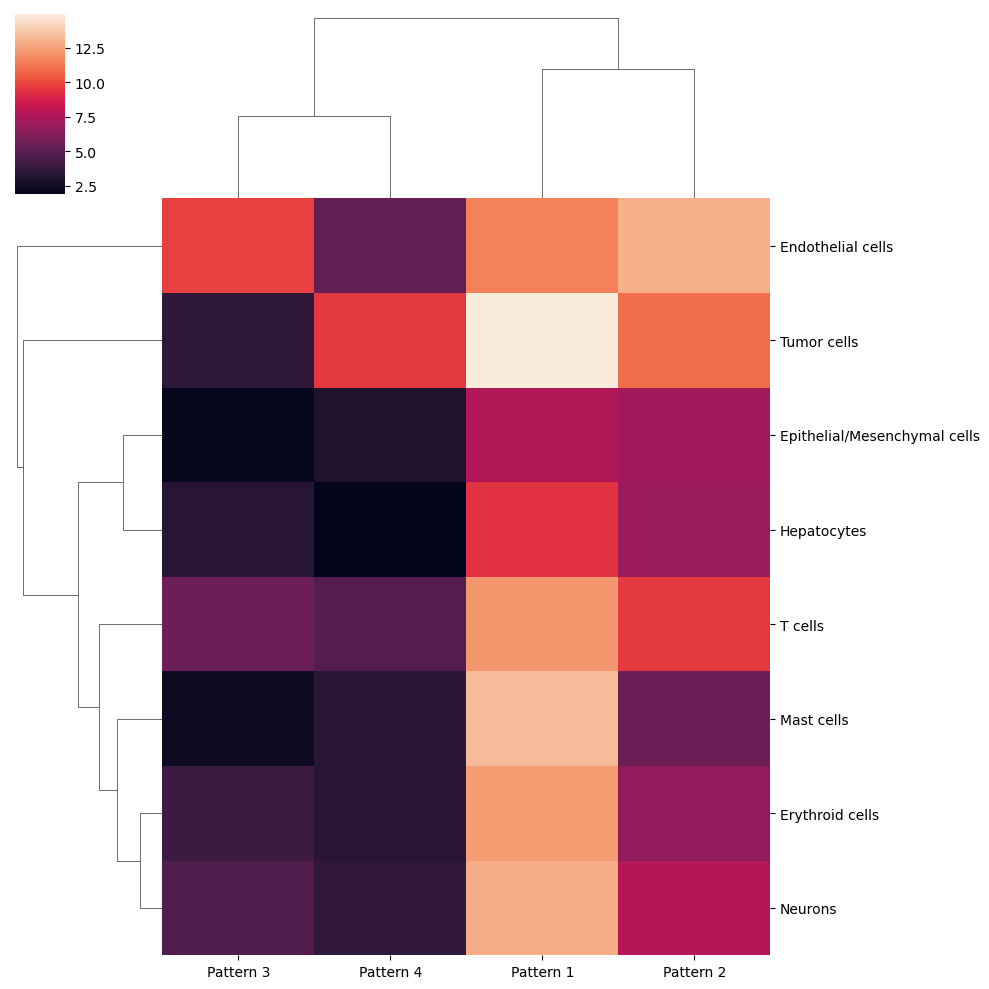

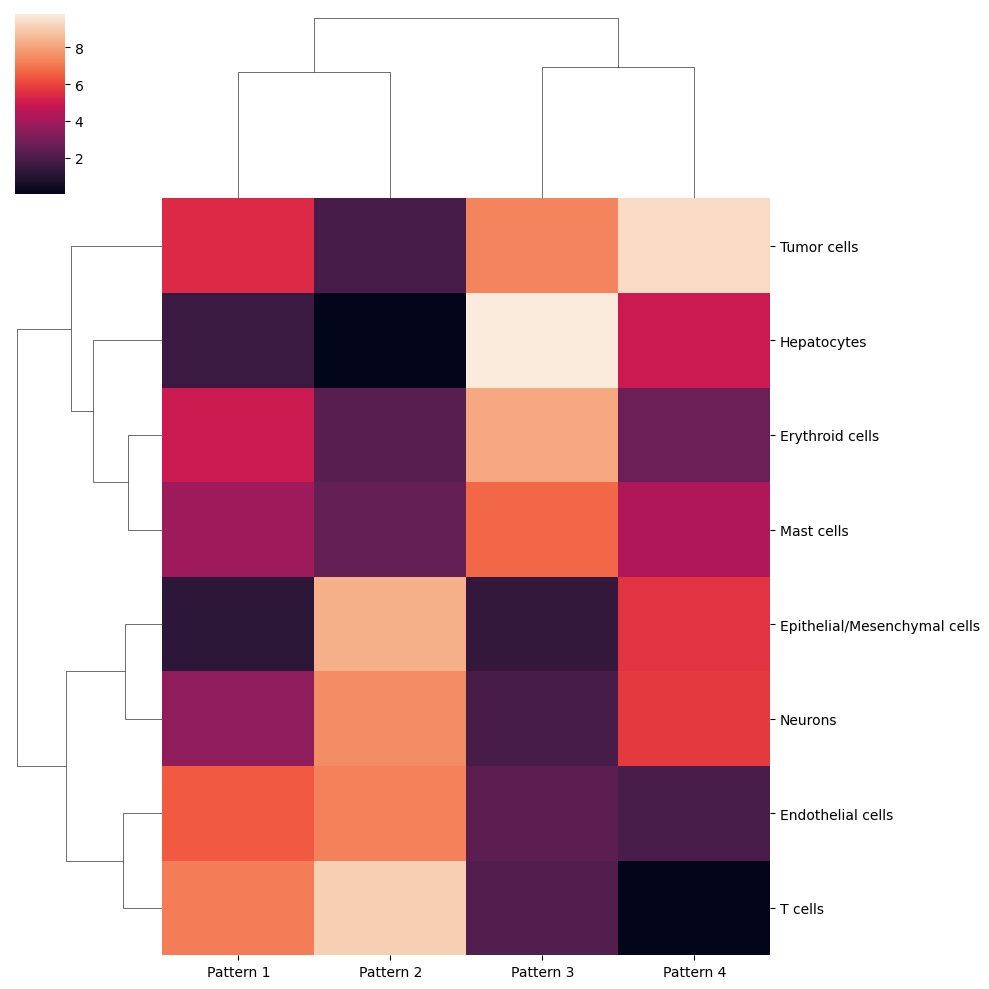

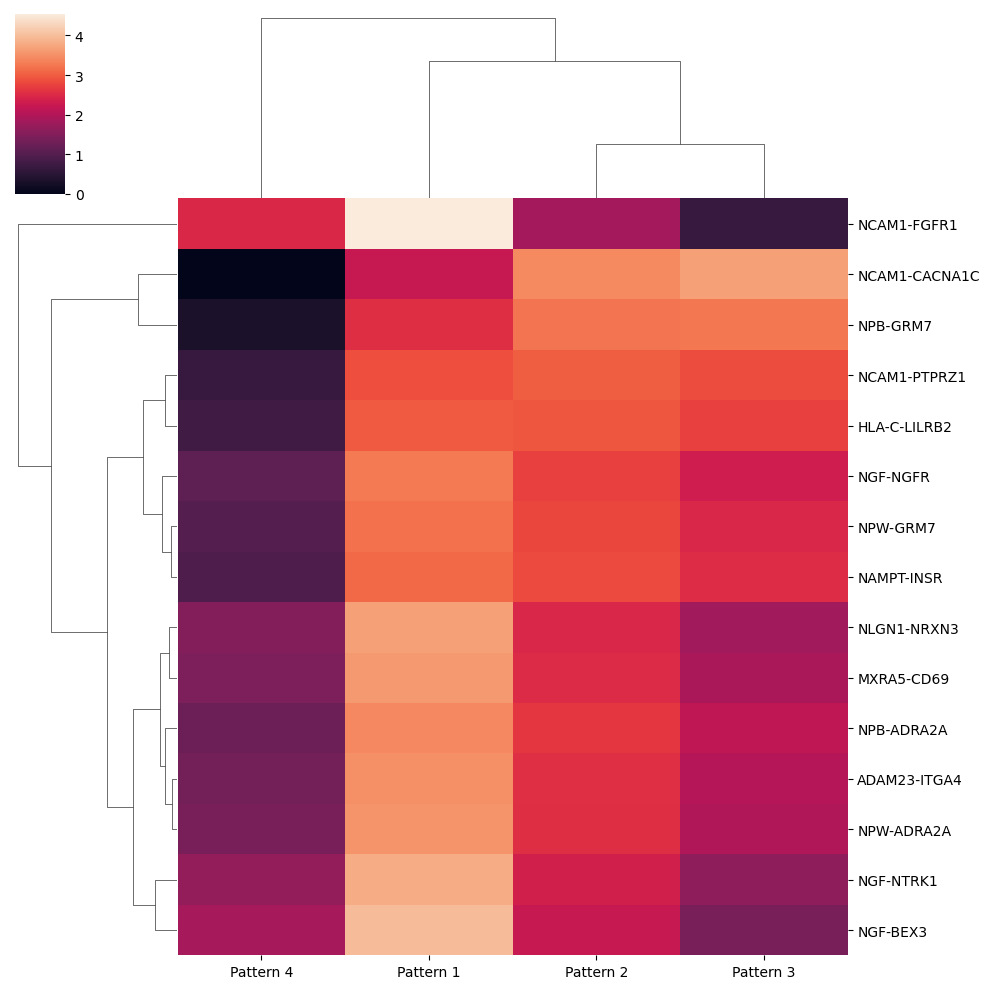

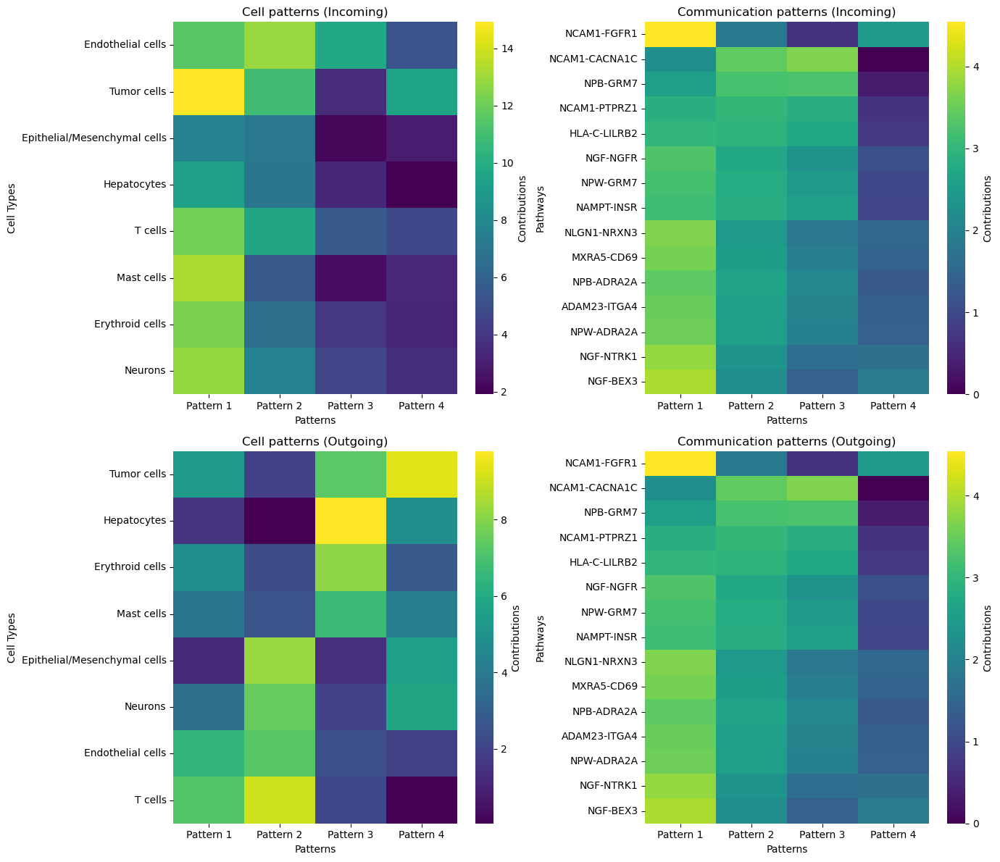

Analysis complete!


In [24]:
results = run_cellchat_like_analysis(filtered_combined_tumor_int, cluster_key='cell_type', n_patterns=4)

Based on these results, we can form several hypotheses about the cellular communication in hepatoblastoma:
The analysis reveals distinct communication patterns within the hepatoblastoma tumor microenvironment that may have important implications for tumor biology and potential therapeutic approaches. Pattern 1, dominated by NCAM1-mediated signaling to endothelial cells and tumor cells, suggests a critical role for neural cell adhesion molecule signaling in both tumor cell growth and angiogenesis. This aligns with literature showing that NCAM1 overexpression is associated with aggressive hepatoblastoma phenotypes and poor outcomes.
Pattern 2 shows strong T cell involvement both as receivers and senders of signals, particularly through NGF-related pathways, suggesting active immune surveillance within the tumor. The involvement of MXRA5-CD69 interactions in this pattern may indicate a mechanism for regulating T cell activation in the tumor microenvironment. Meanwhile, Pattern 3 highlights hepatocyte-specific communication, potentially representing remnants of normal liver signaling persisting within the tumor.
The clustering analysis further reveals that tumor cells and hepatocytes share similar outgoing signaling profiles, supporting the hepatic origin of hepatoblastoma and suggesting that tumor cells retain some of the communication patterns of their cells of origin. Endothelial cells receive similar signals to tumor cells, which could indicate angiogenic signaling essential for tumor growth and invasion. The prominent role of neuronal-related signaling molecules (NCAM1, NGF, NTRK1) across multiple patterns suggests potential neural regulation of hepatoblastoma, which could represent an unexplored therapeutic target.
Collectively, these findings provide a comprehensive view of the complex cellular cross-talk within hepatoblastoma and identify key communication hubs that could be targeted for therapeutic intervention. Further validation of these patterns in a larger cohort could lead to the identification of prognostic biomarkers and novel therapeutic strategies for this pediatric liver cancer.

# Pseudotime Analysis with Diffusion Maps

The following code implements diffusion pseudotime (DPT) analysis to model cellular differentiation trajectories in hepatoblastoma. The approach uses diffusion maps to embed cells in a low-dimensional space based on transcriptional similarity, then calculates pseudotime distances from a defined root cell type (hepatocytes) to infer developmental progression. This allows for reconstruction of potential cell state transitions during hepatoblastoma development, capturing the continuous nature of cellular differentiation rather than discrete clustering.

In [33]:
def run_diffusion_pseudotime(adata, cluster_key='cell_type', root_group=None):
    """Run diffusion pseudotime analysis"""
    # Calculate diffusion map
    sc.tl.diffmap(adata)
    sc.pl.diffmap(adata, color=cluster_key)
    
    # If root group is specified, use cells from that group as root
    if root_group is not None and root_group in adata.obs[cluster_key].cat.categories:
        # Use the first cell from the root group as the root cell
        root_idx = np.where(adata.obs[cluster_key] == root_group)[0][0]
        
        # Set the root cell index in adata.uns
        adata.uns['iroot'] = root_idx
        
        # Compute diffusion pseudotime
        sc.tl.dpt(adata)
        
        # Plot on diffusion map
        sc.pl.diffmap(adata, color=['dpt_pseudotime', cluster_key])
        
        # Visualize pseudotime on UMAP
        sc.pl.umap(adata, color=['dpt_pseudotime', cluster_key])
        
        # Get mean pseudotime per cluster
        pseudo_means = adata.obs.groupby(cluster_key)['dpt_pseudotime'].mean().sort_values()
        
        # Create a DataFrame for plotting to avoid the duplicate labels issue
        plot_data = adata.obs.reset_index()[['dpt_pseudotime', cluster_key]].copy()
        
        # Plot pseudotime by cluster
        plt.figure(figsize=(10, 6))
        # Use the DataFrame we just created instead of adata.obs directly
        sns.boxplot(data=plot_data, x=cluster_key, y='dpt_pseudotime', 
                  order=pseudo_means.index.tolist())  # Convert index to list
        plt.xticks(rotation=45)
        plt.title('Pseudotime Distribution by Cluster')
        plt.tight_layout()
        plt.show()
        
        return pseudo_means
    else:
        print(f"Root group '{root_group}' not found. Available groups: {adata.obs[cluster_key].cat.categories.tolist()}")
        return None

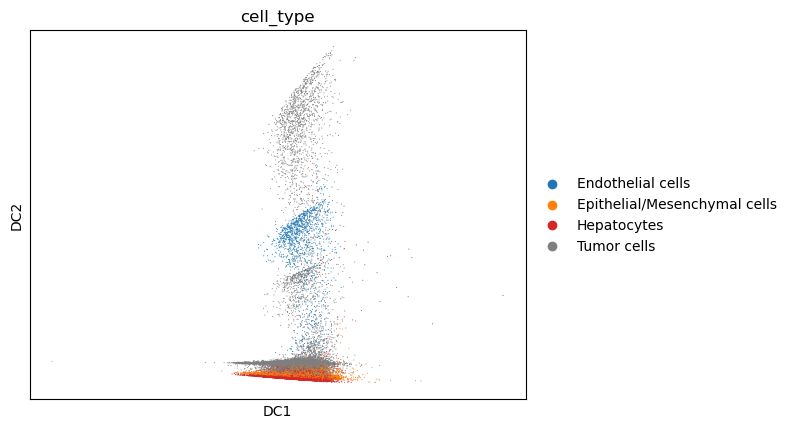

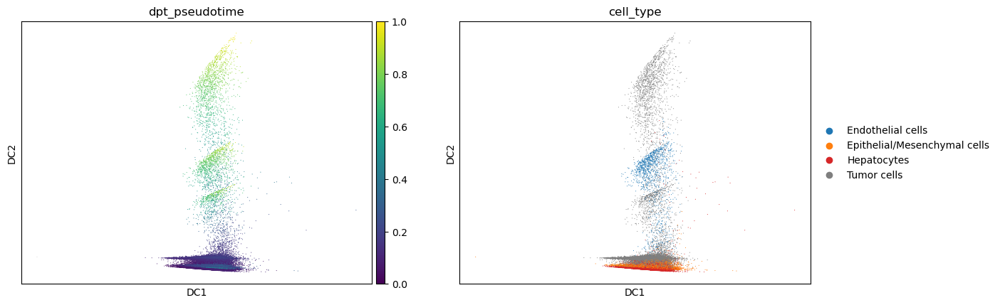

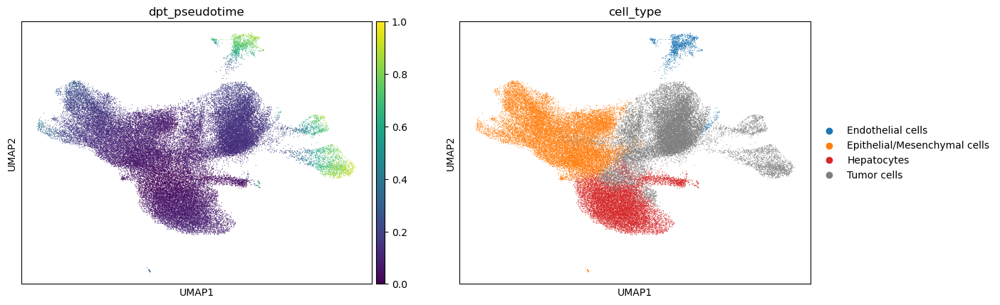

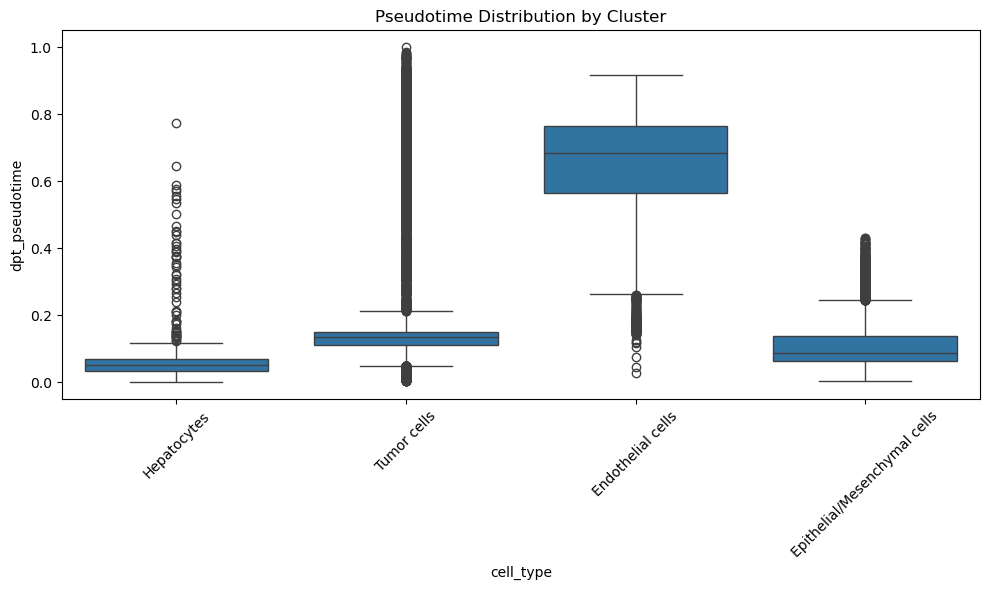

In [36]:
relevant_types = ['Tumor cells', 'Epithelial/Mesenchymal cells', 'Hepatocytes', 'Endothelial cells']
mask = filtered_combined_tumor_int.obs['cell_type'].isin(relevant_types)
tumor_subset = filtered_combined_tumor_int[mask].copy()
pseudo_means = run_diffusion_pseudotime(tumor_subset,cluster_key='cell_type',root_group='Hepatocytes')

The diffusion pseudotime analysis reveals a potential cellular differentiation pathway in hepatoblastoma development. Starting from normal hepatocytes, the trajectory suggests a progression through intermediate epithelial/mesenchymal and tumor cell states, culminating in endothelial-like cells. This pattern suggests multiple hypotheses about hepatoblastoma biology:

Epithelial-Mesenchymal Transition (EMT): The intermediate position of epithelial/mesenchymal cells suggests EMT may be a critical process in hepatoblastoma progression, where normal hepatocytes acquire mesenchymal characteristics before full transformation.
Tumor-Driven Angiogenesis: The terminal position of endothelial cells in the pseudotime trajectory suggests that angiogenesis is a late event in hepatoblastoma development. This is consistent with the concept that growing tumors induce their own vascularization to support continued growth.
Cellular Plasticity/Transdifferentiation: The continuous nature of the trajectory from hepatocytes to endothelial cells raises the intriguing possibility of cellular plasticity or even transdifferentiation, where tumor cells may directly contribute to blood vessel formation through a process resembling endothelial mimicry.
Heterogeneous Tumor Evolution: The broad distribution of tumor cells across different pseudotime values suggests hepatoblastoma contains subpopulations at various stages of differentiation or transformation, potentially reflecting functional heterogeneity within the tumor.

These findings could have implications for targeted therapy development by identifying stage-specific markers along the differentiation trajectory, particularly for disrupting the apparent progression toward angiogenesis, which appears to be a late but potentially critical event in hepatoblastoma development.